<a href="https://colab.research.google.com/github/claudio1975/Climate_Change_Risk_Modelling_with_LLMs/blob/main/Flood_Exploratory_Data_Analysis_work_v_1_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Prepare Workspace

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
import datetime
import scipy
import scipy.stats as stats
from pandas.plotting import autocorrelation_plot
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from math import radians, sin, cos, sqrt, atan2
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.feature_extraction.text import CountVectorizer
import wordcloud
from wordcloud import WordCloud, STOPWORDS

import warnings
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

### Upload Data set

In [7]:
df=pd.read_csv('flood_dataset_fe3.csv',index_col=0)

### Hanfling Date Time format

In [8]:
# Trasform BEGIN_DATE_TIME and END_DATE_TIME in datetime format
df["BEGIN_DATE_TIME"] = pd.to_datetime(df["BEGIN_DATE_TIME"], format="%d-%b-%y %H:%M:%S")
df["END_DATE_TIME"] = pd.to_datetime(df["END_DATE_TIME"], format="%d-%b-%y %H:%M:%S")

In [9]:
# Cast datetime variable in datetime format.
df.index = pd.to_datetime(df.BEGIN_DATE_TIME)
df.index.names = ['Date']
# Sanity check: data span.
df.index.min(), df.index.max()

(Timestamp('2006-10-02 14:00:00'), Timestamp('2022-12-31 23:00:00'))

### Have a brief look of the data set

In [10]:
df.shape

(38398, 52)

In [11]:
df.columns

Index(['EVENT_ID', 'BEGIN_DATE_TIME', 'END_DATE_TIME', 'STATE', 'STATE_FIPS',
       'EVENT_TYPE', 'CZ_TYPE', 'CZ_FIPS', 'CZ_NAME', 'WFO', 'CZ_TIMEZONE',
       'INJURIES_DIRECT', 'INJURIES_INDIRECT', 'DEATHS_DIRECT',
       'DEATHS_INDIRECT', 'DAMAGE_PROPERTY', 'DAMAGE_CROPS', 'SOURCE',
       'FLOOD_CAUSE', 'BEGIN_RANGE', 'BEGIN_AZIMUTH', 'BEGIN_LOCATION',
       'END_RANGE', 'END_AZIMUTH', 'END_LOCATION', 'BEGIN_LAT', 'BEGIN_LON',
       'END_LAT', 'END_LON', 'EPISODE_NARRATIVE', 'EVENT_NARRATIVE',
       'predicted_sentiment_gpt', 'embed_episod_gpt0', 'embed_episod_gpt1',
       'embed_episod_gpt2', 'embed_episod_gpt3', 'embed_episod_gpt4',
       'embed_episod_gpt5', 'embed_episod_gpt6', 'embed_episod_gpt7',
       'embed_episod_gpt8', 'embed_episod_gpt9', 'embed_event_gpt0',
       'embed_event_gpt1', 'embed_event_gpt2', 'embed_event_gpt3',
       'embed_event_gpt4', 'embed_event_gpt5', 'embed_event_gpt6',
       'embed_event_gpt7', 'embed_event_gpt8', 'embed_event_gpt9'],
      

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 38398 entries, 2006-10-28 14:00:00 to 2022-12-27 06:15:00
Data columns (total 52 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   EVENT_ID                 38398 non-null  int64         
 1   BEGIN_DATE_TIME          38398 non-null  datetime64[ns]
 2   END_DATE_TIME            38398 non-null  datetime64[ns]
 3   STATE                    38398 non-null  object        
 4   STATE_FIPS               38398 non-null  float64       
 5   EVENT_TYPE               38398 non-null  object        
 6   CZ_TYPE                  38398 non-null  object        
 7   CZ_FIPS                  38398 non-null  int64         
 8   CZ_NAME                  38398 non-null  object        
 9   WFO                      38398 non-null  object        
 10  CZ_TIMEZONE              38398 non-null  object        
 11  INJURIES_DIRECT          38398 non-null  int64         
 1

In [13]:
df.head()

,EVENT_ID,BEGIN_DATE_TIME,END_DATE_TIME,STATE,STATE_FIPS,EVENT_TYPE,CZ_TYPE,CZ_FIPS,CZ_NAME,WFO,...,embed_event_gpt0,embed_event_gpt1,embed_event_gpt2,embed_event_gpt3,embed_event_gpt4,embed_event_gpt5,embed_event_gpt6,embed_event_gpt7,embed_event_gpt8,embed_event_gpt9
Date,,,,,,,,,,,,,,,,,,,,,
2006-10-28 14:00:00,2161,2006-10-28 14:00:00,2006-10-28 16:30:00,MASSACHUSETTS,25.0,Flood,C,25,SUFFOLK,BOX,...,-0.005580,-0.009172,-0.000350,-0.001341,-0.020569,-0.002682,-0.017443,0.013211,-0.015320,-0.032622
2006-11-16 20:00:00,4734,2006-11-16 20:00:00,2006-11-16 22:00:00,NEW YORK,36.0,Flood,C,43,HERKIMER,ALY,...,-0.010368,-0.004088,-0.001276,0.008959,-0.041108,0.024286,-0.024926,-0.009651,-0.005599,-0.019380
2006-11-16 23:49:00,3709,2006-11-16 23:49:00,2006-11-17 05:28:00,NEW YORK,36.0,Flood,C,57,MONTGOMERY,ALY,...,-0.008556,-0.010422,0.000788,0.008634,-0.009571,0.031676,-0.023744,-0.016657,-0.027255,-0.015474
2006-11-17 05:03:00,3718,2006-11-17 05:03:00,2006-11-17 13:56:00,NEW YORK,36.0,Flood,C,57,MONTGOMERY,ALY,...,-0.019469,-0.015229,0.002395,0.007543,0.007504,0.027961,-0.023019,-0.020938,-0.020496,-0.022239
2006-11-17 05:03:00,3720,2006-11-17 05:03:00,2006-11-17 13:56:00,NEW YORK,36.0,Flood,C,93,SCHENECTADY,ALY,...,-0.019469,-0.015229,0.002395,0.007543,0.007504,0.027961,-0.023019,-0.020938,-0.020496,-0.022239


In [89]:
df.iloc[:,0:31].describe(include='all').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
EVENT_ID,38398.0,NaN,NaN,NaN,NaT,NaT,582042.643888,293802.225946,350.0,320257.25,641838.5,814379.5,1095508.0
BEGIN_DATE_TIME,38398,27478,2019-06-01 00:00:00,204,2006-10-02 14:00:00,2022-12-31 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
END_DATE_TIME,38398,25667,2019-05-31 23:59:00,191,2006-10-02 16:00:00,2022-12-31 23:59:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STATE,38398,54,VIRGINIA,2581,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STATE_FIPS,38398.0,NaN,NaN,NaN,NaT,NaT,30.809313,17.77272,1.0,19.0,29.0,42.0,99.0
EVENT_TYPE,38398,1,Flood,38398,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CZ_TYPE,38398,1,C,38398,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CZ_FIPS,38398.0,NaN,NaN,NaN,NaT,NaT,88.147924,82.932916,1.0,29.0,71.0,127.0,840.0
CZ_NAME,38398,1754,WASHINGTON,469,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WFO,38398,121,LWX,3289,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Build features

In [15]:
# Created year, month, day, time begin/end feature
df_1 = df.copy()
df_1['YEAR_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).year
df_1['MONTH_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).month
df_1['DAY_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).day
df_1['HOUR_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).hour
df_1['YEAR_BEGIN']= df_1["YEAR_BEGIN"].astype("int64")
df_1['MONTH_BEGIN']= df_1["MONTH_BEGIN"].astype("int64")
df_1['DAY_BEGIN']= df_1["DAY_BEGIN"].astype("int64")
df_1['HOUR_BEGIN']= df_1["HOUR_BEGIN"].astype("int64")
df_1['YEAR_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).year
df_1['MONTH_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).month
df_1['DAY_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).day
df_1['HOUR_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).hour
df_1['YEAR_END']= df_1["YEAR_END"].astype("int64")
df_1['MONTH_END']= df_1["MONTH_END"].astype("int64")
df_1['DAY_END']= df_1["DAY_END"].astype("int64")
df_1['HOUR_END']= df_1["HOUR_END"].astype("int64")

In [16]:
# Calculate the difference between dates and convert it to days and hours
df_1['DAY_DURATION'] = (df_1['END_DATE_TIME'] - df_1['BEGIN_DATE_TIME']).dt.days
df_1['HOUR_DURATION'] = (df_1['END_DATE_TIME'] - df_1['BEGIN_DATE_TIME']).dt.total_seconds() / 3600


In [17]:
# Merge Origin and Destination to have a look at the round event
df_1['LOCATION_ORIGIN_DESTINATION'] = df_1['BEGIN_LOCATION']+'-'+df_1['END_LOCATION']
df_1['BEGIN_END_AZIMUTH'] = df_1['BEGIN_AZIMUTH']+'-'+df_1['END_AZIMUTH']


In [18]:
# new target features
df_1['WHOLE_INJURIES'] = df_1['INJURIES_INDIRECT'] + df_1['INJURIES_DIRECT']
df_1['WHOLE_DEATHS'] = df_1['DEATHS_INDIRECT'] + df_1['DEATHS_DIRECT']
df_1['WHOLE_DAMAGE'] = df_1['DAMAGE_CROPS'] + df_1['DAMAGE_PROPERTY']


In [19]:
# Distance of the event
def haversine_distance(row):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1 = radians(row['BEGIN_LAT']), radians(row['BEGIN_LON'])
    lat2, lon2 = radians(row['END_LAT']), radians(row['END_LON'])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    radius_of_earth = 6371  # Earth's radius in kilometers
    distance = radius_of_earth * c

    return distance

In [20]:
# Distance
df_1['DISTANCE'] = df_1.apply(haversine_distance, axis=1)
df_1['DISTANCE_RANGE']=df_1['END_RANGE']-df_1['BEGIN_RANGE']

In [21]:
# Drop old variables replaced by new variables
df_2=df_1.copy()
df_2 = df_2.drop(['BEGIN_LOCATION','END_LOCATION','BEGIN_AZIMUTH','END_AZIMUTH',
                  'INJURIES_INDIRECT','DEATHS_INDIRECT','DAMAGE_CROPS',
                  'END_RANGE','BEGIN_RANGE','BEGIN_LAT','BEGIN_LON','END_LAT','END_LON'], axis=1)

### BRIEF STATISTICS of EVENT

In [92]:
num_cols = [cname for cname in df_2.columns if
            df_2[cname].dtype in ['float64','int64']]
num_dist = df_2[num_cols]
num_dist.describe().T

,count,mean,std,min,25%,50%,75%,max
EVENT_ID,38398.0,582042.643888,2.938022e+05,350.000000,320257.250000,641838.500000,814379.500000,1.095508e+06
STATE_FIPS,38398.0,30.809313,1.777272e+01,1.000000,19.000000,29.000000,42.000000,9.900000e+01
CZ_FIPS,38398.0,88.147924,8.293292e+01,1.000000,29.000000,71.000000,127.000000,8.400000e+02
INJURIES_DIRECT,38398.0,0.002787,9.308484e-02,0.000000,0.000000,0.000000,0.000000,1.000000e+01
DEATHS_DIRECT,38398.0,0.010600,1.364297e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+01
DAMAGE_PROPERTY,38398.0,702996.161519,2.111301e+07,0.000000,0.000000,0.000000,1000.000000,2.000000e+09
embed_episod_gpt0,38398.0,-0.016808,9.427289e-03,-0.052020,-0.023349,-0.016708,-0.010367,2.152841e-02
embed_episod_gpt1,38398.0,-0.006413,1.020446e-02,-0.045055,-0.013191,-0.005958,0.000404,3.014877e-02
embed_episod_gpt2,38398.0,0.004548,9.585507e-03,-0.034101,-0.001928,0.004899,0.011089,3.863915e-02
embed_episod_gpt3,38398.0,-0.008144,1.052920e-02,-0.047241,-0.015404,-0.008313,-0.001156,3.534336e-02


In [101]:
class_cols = [cname for cname in df_2.columns if
                    df_2[cname].dtype in ['object']]
class_dist = df_2[class_cols]
class_dist.describe().T

,count,unique,top,freq
STATE,38398,54,VIRGINIA,2581
EVENT_TYPE,38398,1,Flood,38398
CZ_TYPE,38398,1,C,38398
CZ_NAME,38398,1754,WASHINGTON,469
WFO,38398,121,LWX,3289
CZ_TIMEZONE,38398,8,EST-5,16548
SOURCE,38398,33,River/Stream Gage,8333
FLOOD_CAUSE,38398,7,Heavy Rain,32799
EPISODE_NARRATIVE,38398,10895,Heavy rain on saturated soils during the eveni...,110
EVENT_NARRATIVE,38398,36411,See the event episode narrative for details.,46


In [25]:
date_cols = [cname for cname in df_1.columns if
             df_1[cname].dtype in ['datetime64[ns]']]
date_dist = df_1[date_cols]
date_dist.describe().T

,count,unique,top,freq,first,last
BEGIN_DATE_TIME,38398,27478,2019-06-01 00:00:00,204,2006-10-02 14:00:00,2022-12-31 23:00:00
END_DATE_TIME,38398,25667,2019-05-31 23:59:00,191,2006-10-02 16:00:00,2022-12-31 23:59:00


### Functions

In [26]:
def statistics(data, var):
    # Univariate analysis looking at Mean, Standard Deviation, Skewness and Kurtosis
    print('Univariate Statistics Analysis')
    print('\nMean :', np.mean(data[var]),
        '\nVariance :', np.var(data[var]),
        '\nStandard Deviation :', np.var(data[var]**0.5),
        '\nSkewness :', stats.skew(data[var]),
        '\nKurtosis :', stats.kurtosis(data[var]))

In [27]:
def groupyear(data, var):
    data_ = data[[var,'YEAR_BEGIN','MONTH_BEGIN']]
    df_year = data_.groupby(['YEAR_BEGIN'], as_index=False)[var].sum()
    df_year_ = pd.DataFrame(df_year).set_index('YEAR_BEGIN')
    return df_year_

In [28]:
def groupmonth(data, var):
    data_ = data[[var,'YEAR_BEGIN','MONTH_BEGIN']]
    df_month = data_.groupby(['MONTH_BEGIN'], as_index=False)[var].sum()
    df_month_ = pd.DataFrame(df_month).set_index('MONTH_BEGIN')
    return df_month_

In [29]:
# target plot
def targetplot(data, var):
    plt.rcParams['figure.figsize'] = (4,4)
    groupyear(data, var=var).plot()
    plt.suptitle("{} vs Date Line plot".format(var), fontsize=10)
    plt.xlabel('YEAR',fontsize=10)
    plt.ylabel(var, fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    groupyear(data, var=var).hist(bins=5)
    plt.xlabel('YEAR',fontsize=10)
    plt.ylabel(var, fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    sns.kdeplot(groupyear(data, var=var))
    plt.suptitle("{} Density distribution".format(var), fontsize=10)
    plt.xlabel('YEAR',fontsize=10)
    plt.ylabel("{}".format(var), fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend()
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    data_ordered = groupyear(data, var=var).sort_values(by=var, ascending=False)
    data_ordered.plot(kind='barh')
    plt.suptitle("{} distribution per YEAR".format(var), fontsize=10)
    plt.xlabel('YEAR',fontsize=10)
    plt.ylabel('{}'.format(var), fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    data_ordered = groupmonth(data, var=var).sort_values(by=var, ascending=False)
    data_ordered.plot(kind='barh')
    plt.suptitle("{} distribution per MONTH".format(var), fontsize=10)
    plt.xlabel('MONTH',fontsize=10)
    plt.ylabel('{}'.format(var), fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    autocorrelation_plot(groupyear(data, var=var))
    plt.suptitle("{} autocorrelation".format(var), fontsize=10)
    plt.xlabel('Lag',fontsize=10)
    plt.ylabel('Autocorrelation',fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    plot_acf(groupyear(data, var=var))
    plt.xlabel('Lag',fontsize=10)
    plt.ylabel('Autocorrelation',fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    plt.rcParams['figure.figsize'] = (4,4)
    plot_pacf(groupyear(data, var=var))
    plt.xlabel('Lag',fontsize=10)
    plt.ylabel('Autocorrelation',fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()

In [30]:
# Decomposition
def decomposition(data, var, model):
    agg_data=data.groupby(pd.Grouper(freq='M')).agg({var: 'sum'})
    # Additive Decomposition
    res = seasonal_decompose(x=agg_data[var], model=model, period=12)
    plt.rcParams['figure.figsize']=(20,20)
    res.plot()
    plt.xlabel('Time', fontsize=20)
    plt.yticks(rotation=0)
    plt.xticks(rotation=45, fontsize=20)
    plt.show()

In [31]:
# Augmented Dickey-Fuller test
def ADF_test(data, var):
    X = data[var].values
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [32]:
def catplot(data, var_c, var_t,threshold):
    data_=df_2[[var_c,var_t]]
    agg_data=data_.groupby([var_c], as_index=False)[var_t].sum()
    agg_data_sorted=agg_data.sort_values(by = var_t, ascending=False).set_index(var_c)[0:10]
    agg_data_sorted.plot.barh()
    plt.rcParams['figure.figsize'] = (4,4)
    plt.title('{} distribution per {}'.format(var_c,var_t), fontsize=10)
    plt.legend(loc='best',bbox_to_anchor=(1, 0.5))
    plt.xlabel('QUANTITY',fontsize=10)
    plt.ylabel('{}'.format(var_c), fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    agg_data_=agg_data.copy()
    agg_data_.loc[agg_data_[var_t] < threshold, var_c] = "OTHERS"
    agg_data_new = agg_data_.groupby([var_c], as_index=False)[var_t].sum()
    plt.pie(agg_data_new[var_t], labels=agg_data_new[var_c], autopct="%1.1f%%")
    plt.title('{} segmentation per {}'.format(var_c,var_t), fontsize=10)
    plt.show()

In [33]:
# Num_plot
def plot_num(data, var):
    plt.rcParams['figure.figsize']=(15,5)
    plt.subplot(1,3,1)
    x=data[var]
    plt.hist(x,color='green',edgecolor='black')
    plt.title('{} histogram'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,2)
    x=data[var]
    sns.boxplot(x, color="orange")
    plt.title('{} boxplot'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,3)
    res = stats.probplot(data[var], plot=plt)
    plt.title('{} Q-Q plot'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)

    plt.show()


In [34]:
def numheatmap(data):
    plt.rcParams['figure.figsize']=(15,15)
    sns.heatmap(data, square = True, annot=True, fmt='.2f')
    plt.title('Correlation Heatmap',size=15)
    plt.yticks(fontsize="10")
    plt.xticks(fontsize="10")
    plt.show()

In [35]:
# Num_Scatterplot
def numscatterplot(data, var, target):
    plt.rcParams['figure.figsize']=(3,3)
    plt.scatter(data[var], data[target])
    plt.xlabel(var, fontsize=10)
    plt.ylabel(target, fontsize=10)
    plt.title('Relationship', fontsize=10)
    plt.show()

In [36]:
df_series=df_2.copy()

### Target Analysis

Univariate Statistics Analysis

Mean : 0.0027866034689306733 
Variance : 0.008664561524788386 
Standard Deviation : 0.0027827153151414783 
Skewness : 58.000337081305645 
Kurtosis : 4651.279302030049


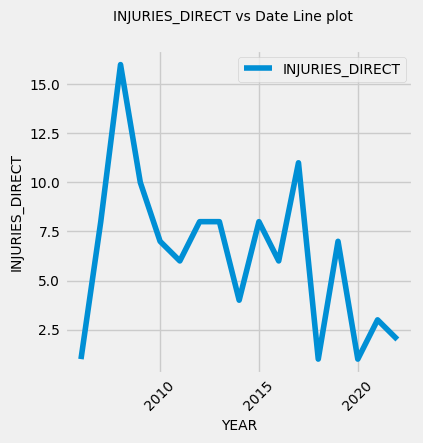

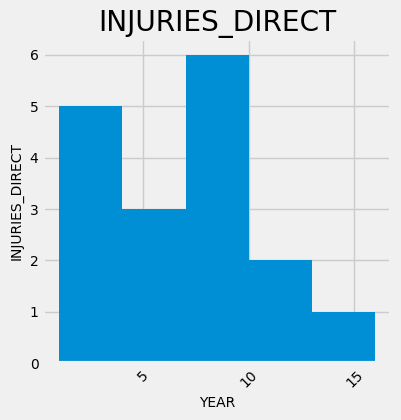

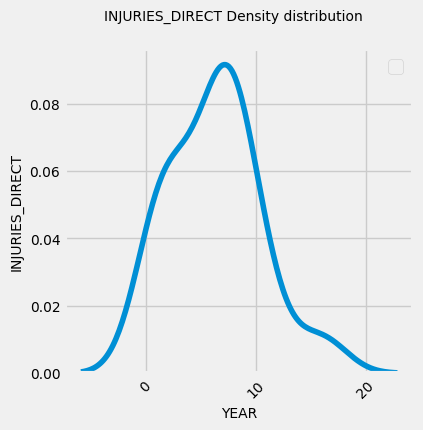

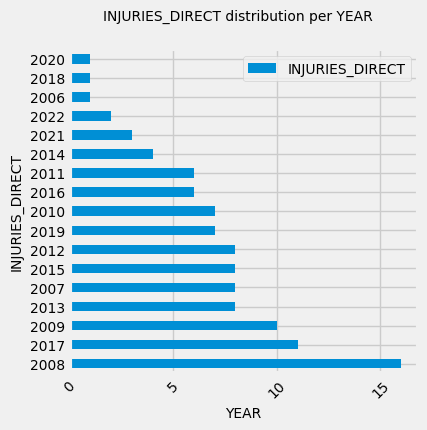

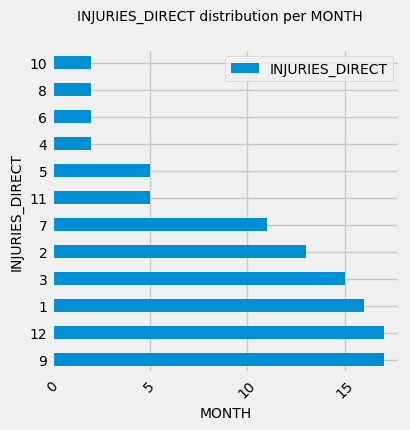

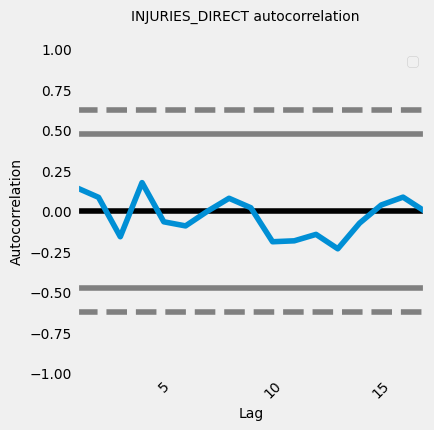

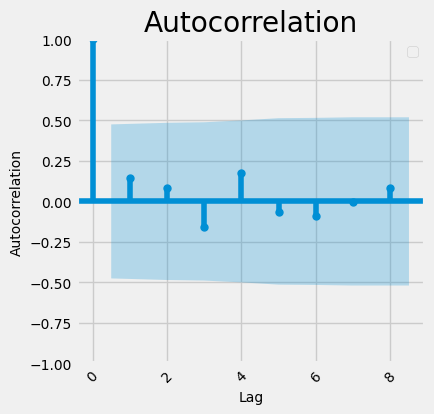

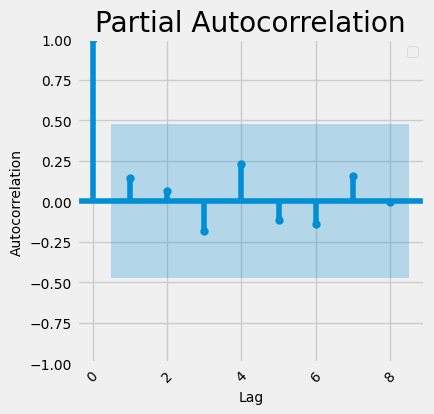

In [37]:
statistics(df_2, var='INJURIES_DIRECT')
targetplot(df_series, var='INJURIES_DIRECT')

Univariate Statistics Analysis

Mean : 0.004114797645710714 
Variance : 0.017171463669253022 
Standard Deviation : 0.004107224005262363 
Skewness : 65.13637084032787 
Kurtosis : 5886.002831740734


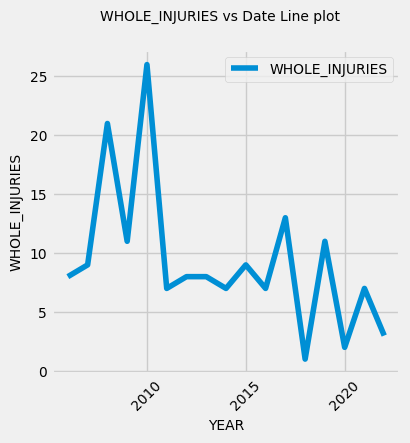

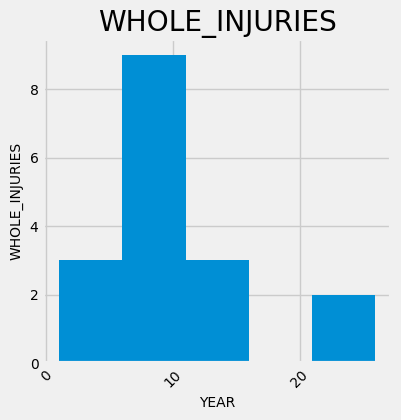

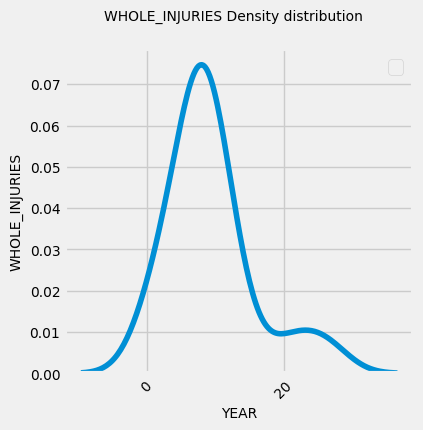

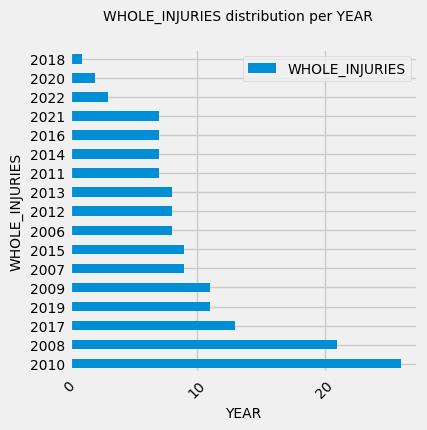

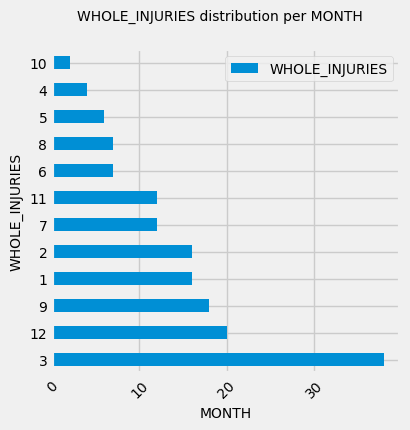

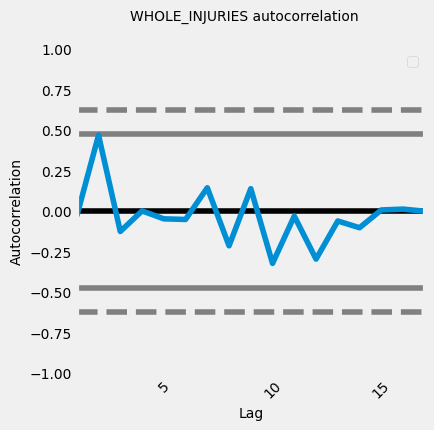

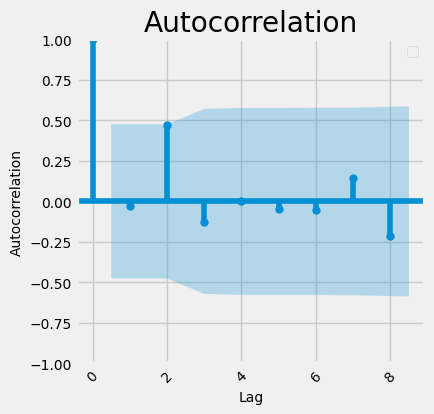

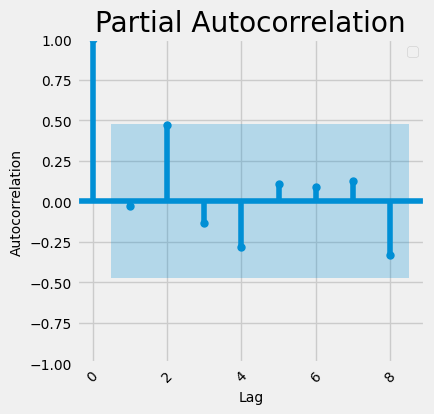

In [38]:
statistics(df_2, var='WHOLE_INJURIES')
targetplot(df_series, var='WHOLE_INJURIES')

Univariate Statistics Analysis

Mean : 0.010599510391166207 
Variance : 0.01861258396975872 
Standard Deviation : 0.010514826769396931 
Skewness : 24.001568245687405 
Kurtosis : 1052.1146470063177


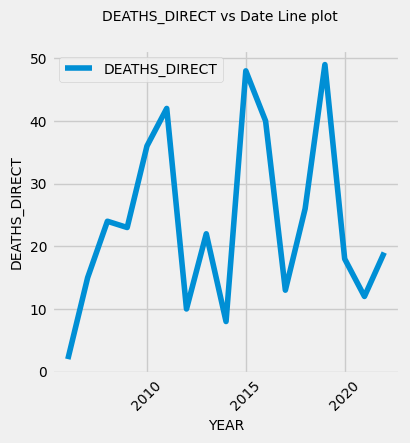

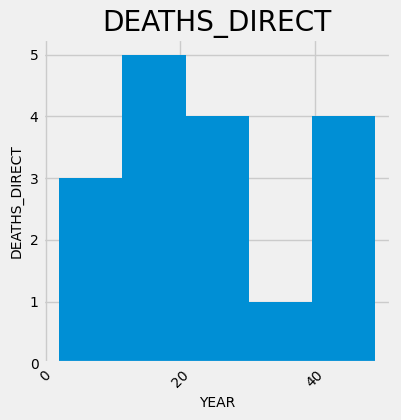

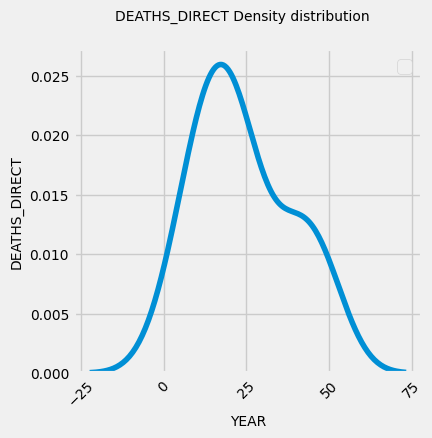

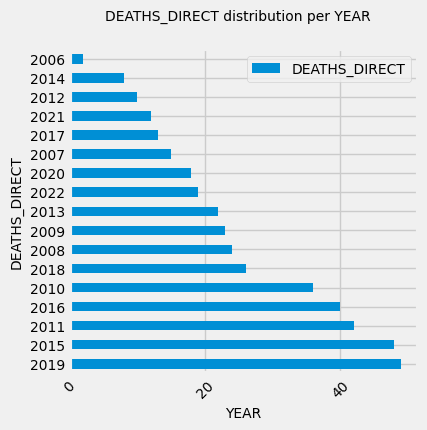

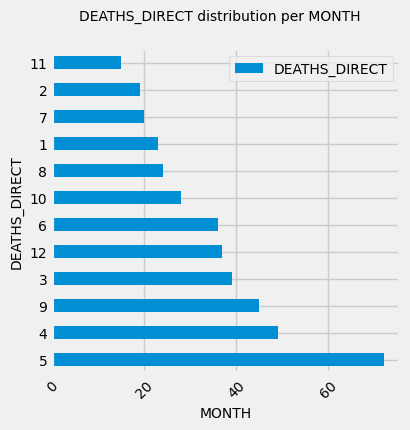

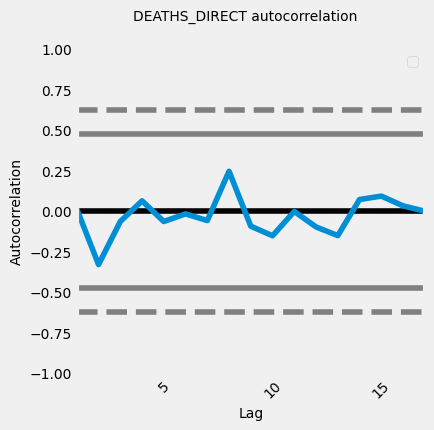

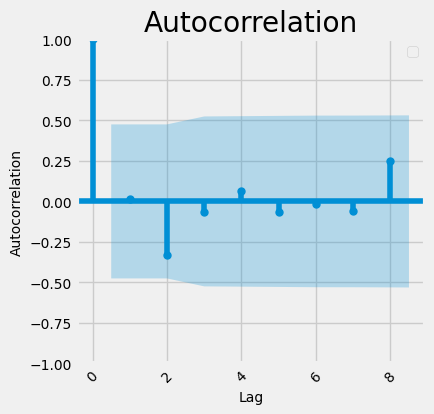

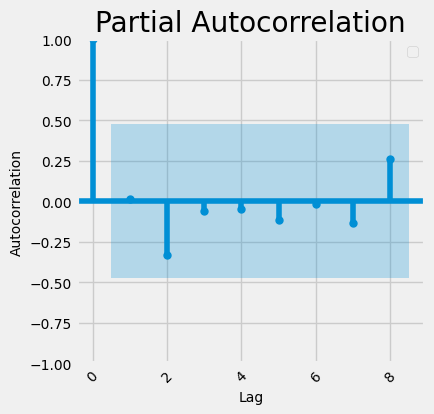

In [39]:
statistics(df_2, var='DEATHS_DIRECT')
targetplot(df_series, var='DEATHS_DIRECT')

Univariate Statistics Analysis

Mean : 0.012083962706390958 
Variance : 0.02094882653534649 
Standard Deviation : 0.011973871912804286 
Skewness : 21.7200804447175 
Kurtosis : 860.2713881396664


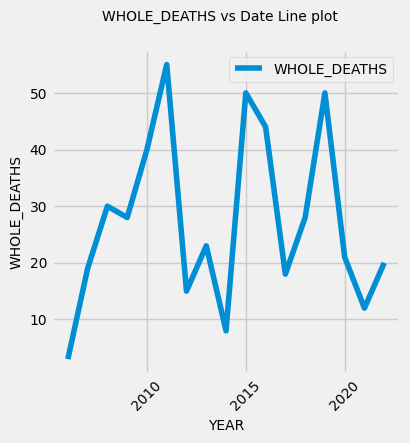

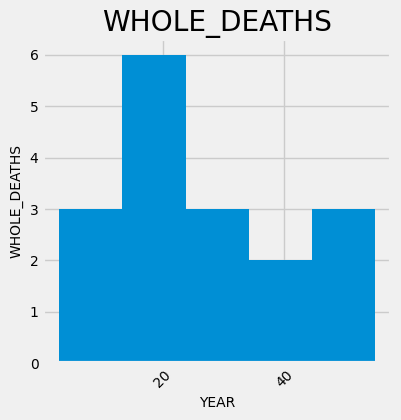

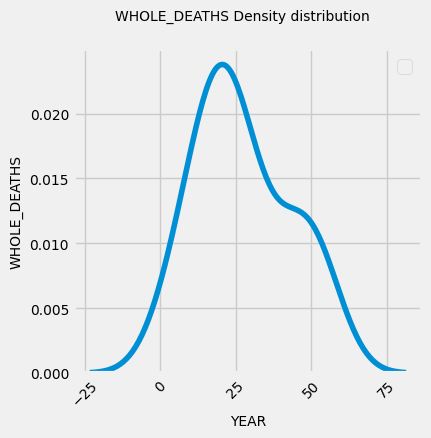

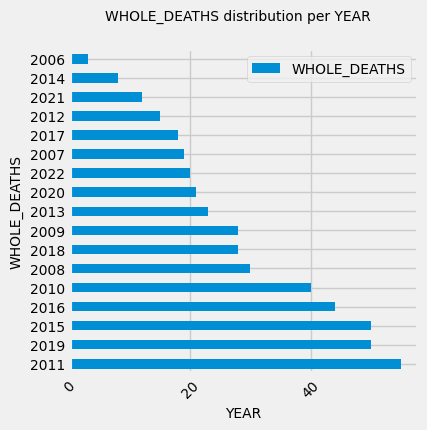

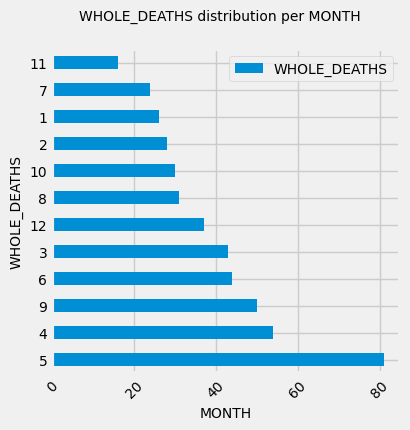

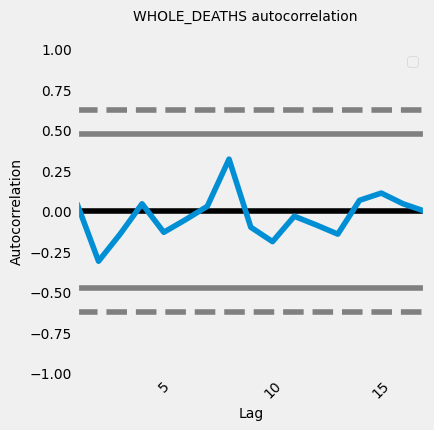

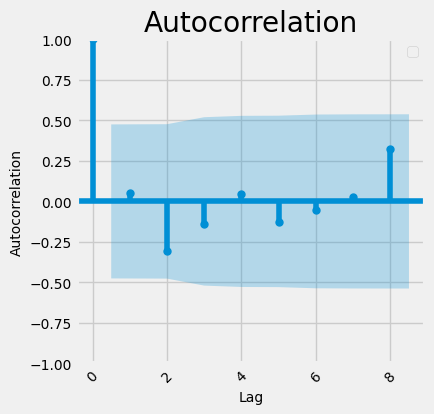

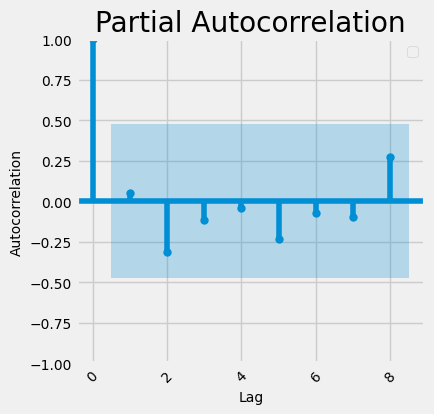

In [40]:
statistics(df_2, var='WHOLE_DEATHS')
targetplot(df_series, var='WHOLE_DEATHS')

Univariate Statistics Analysis

Mean : 702996.1615188291 
Variance : 445747569126608.9 
Standard Deviation : 686160.7816834814 
Skewness : 62.61611594647665 
Kurtosis : 4658.376942807201


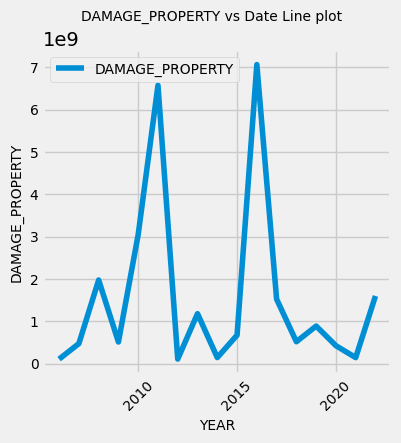

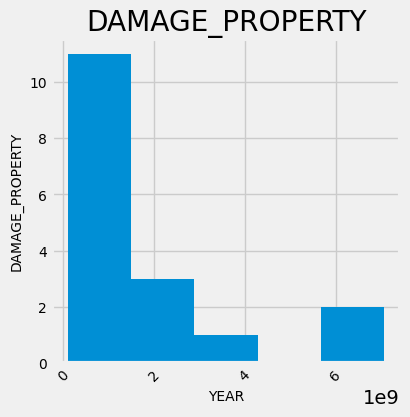

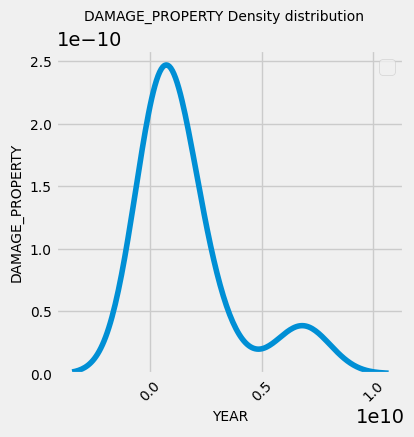

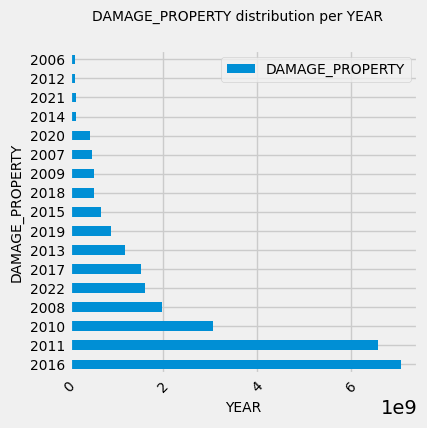

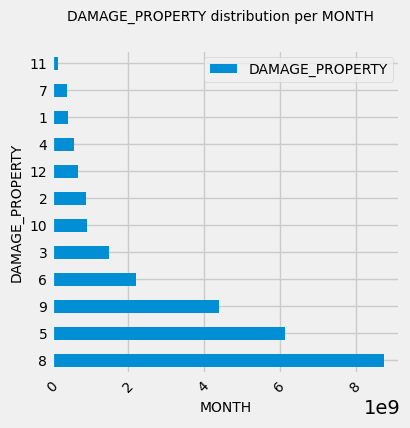

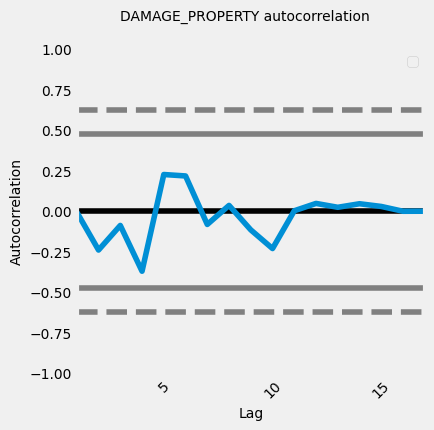

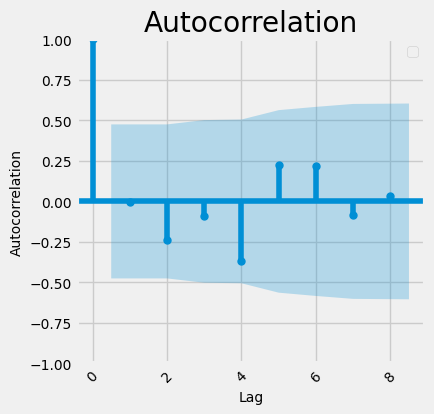

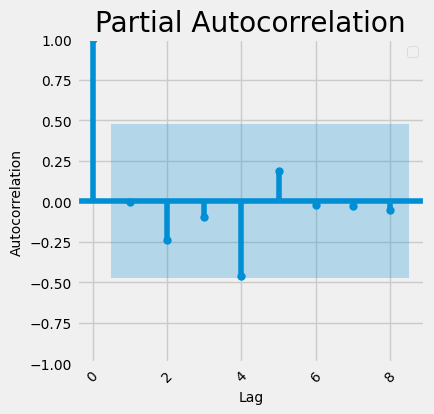

In [41]:
statistics(df_2, var='DAMAGE_PROPERTY')
targetplot(df_2, var='DAMAGE_PROPERTY')

Univariate Statistics Analysis

Mean : 793662.3206937861 
Variance : 458584703863478.3 
Standard Deviation : 772156.1968338237 
Skewness : 60.440617916191 
Kurtosis : 4409.111324512079


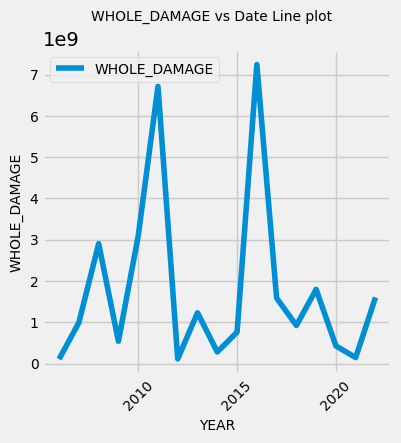

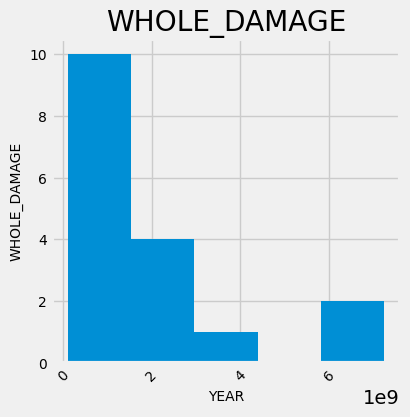

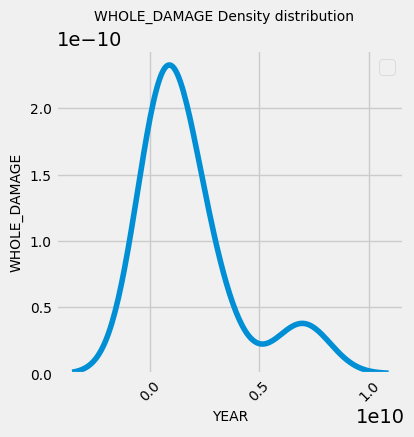

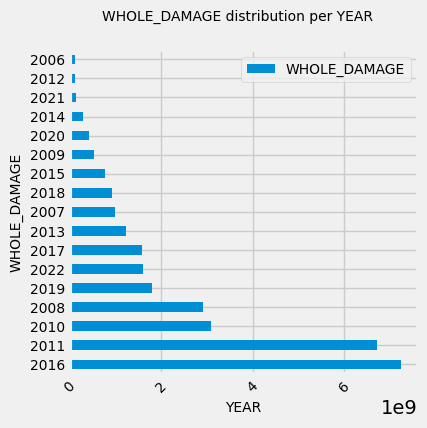

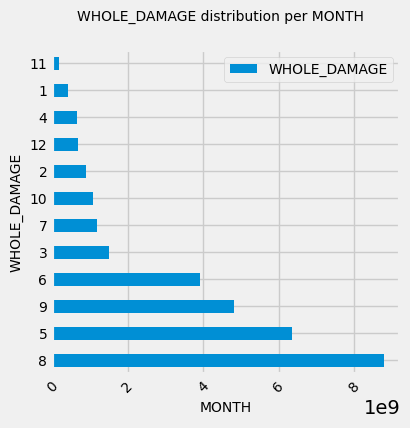

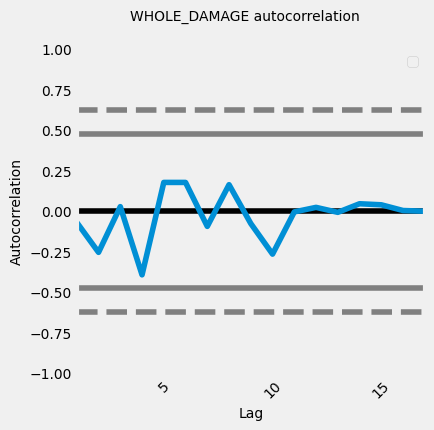

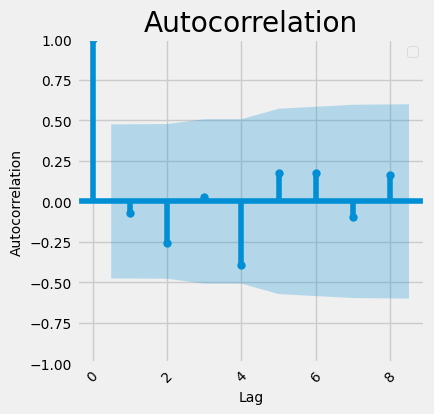

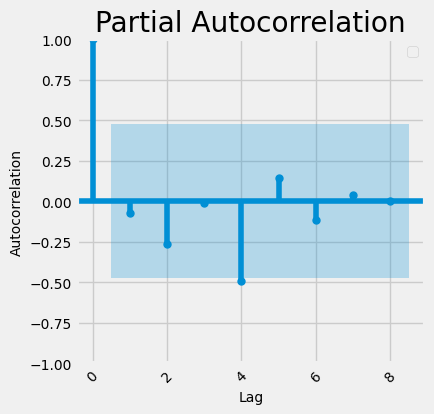

In [42]:
statistics(df_2, var='WHOLE_DAMAGE')
targetplot(df_2, var='WHOLE_DAMAGE')

### Decomposition

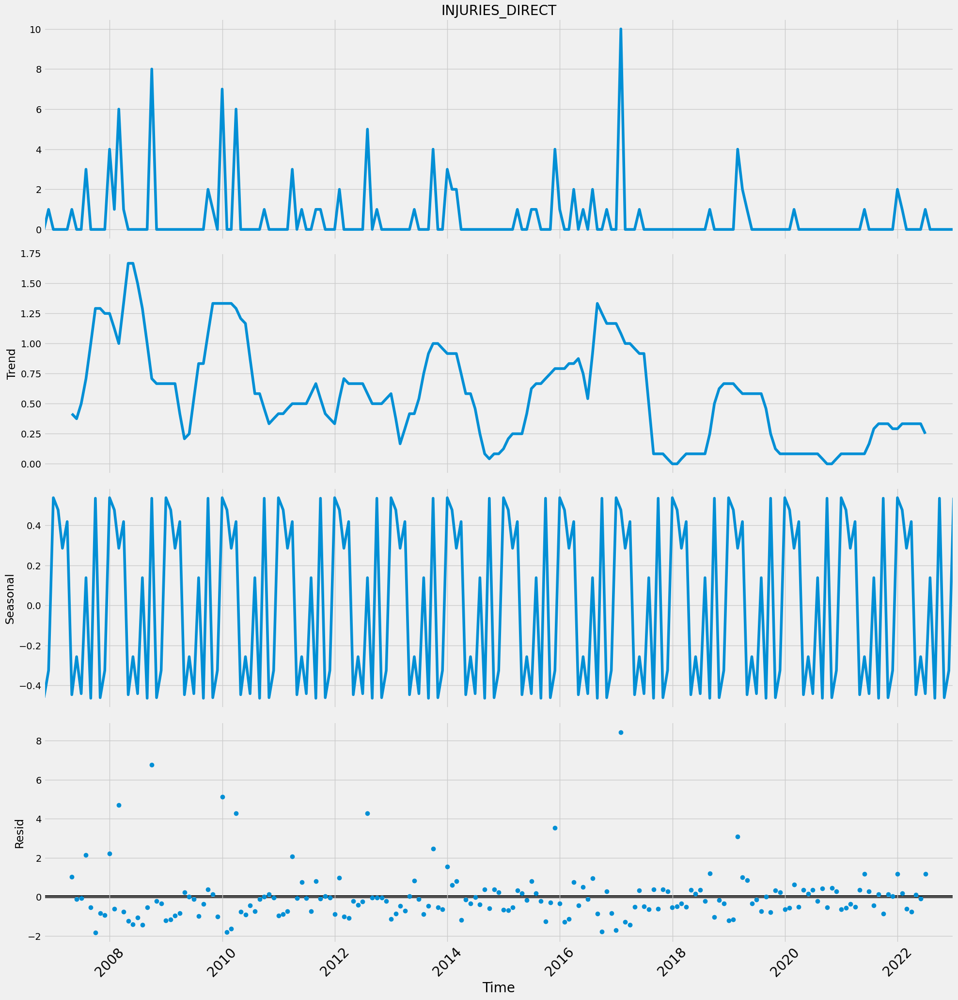

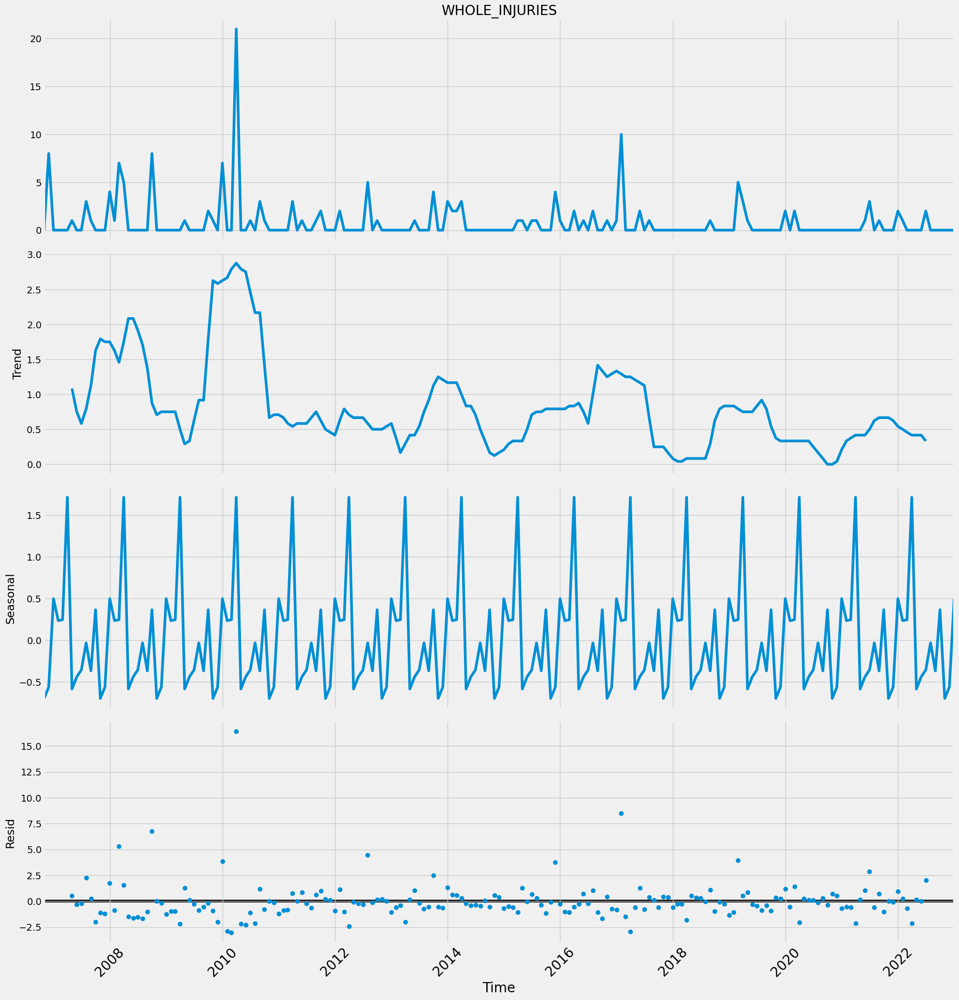

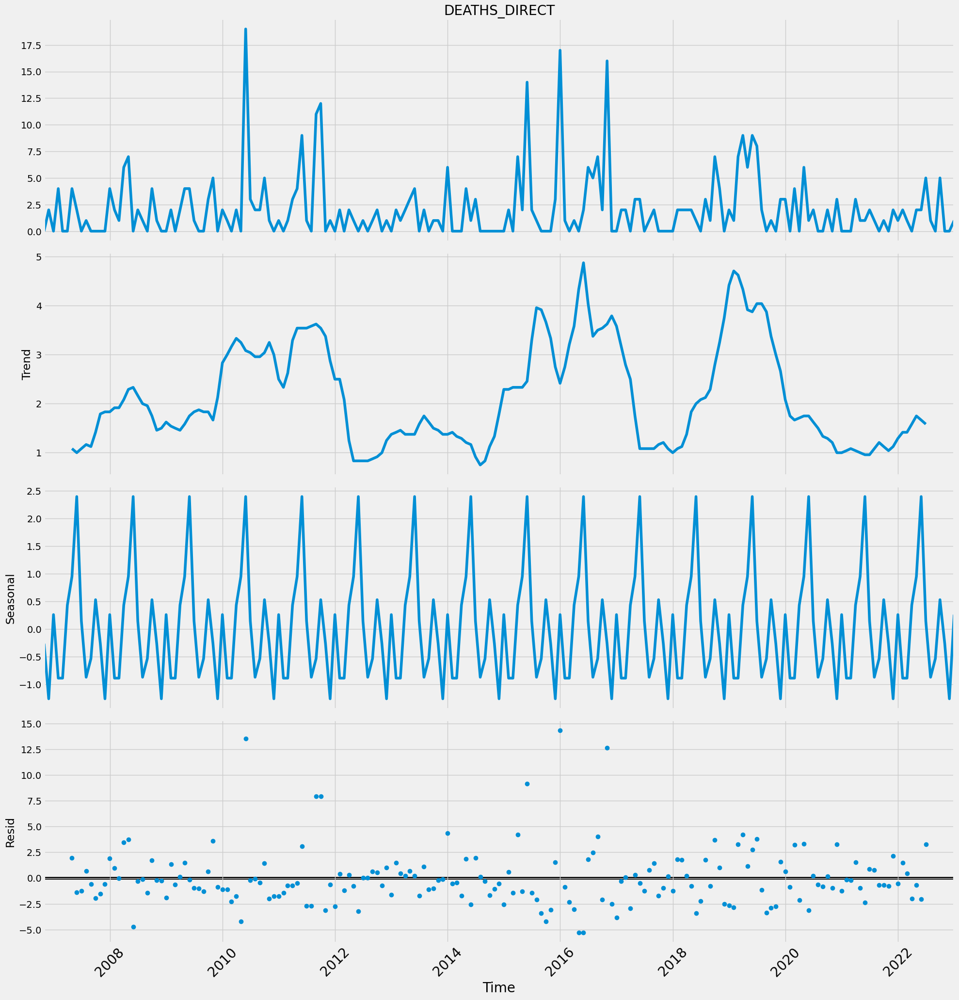

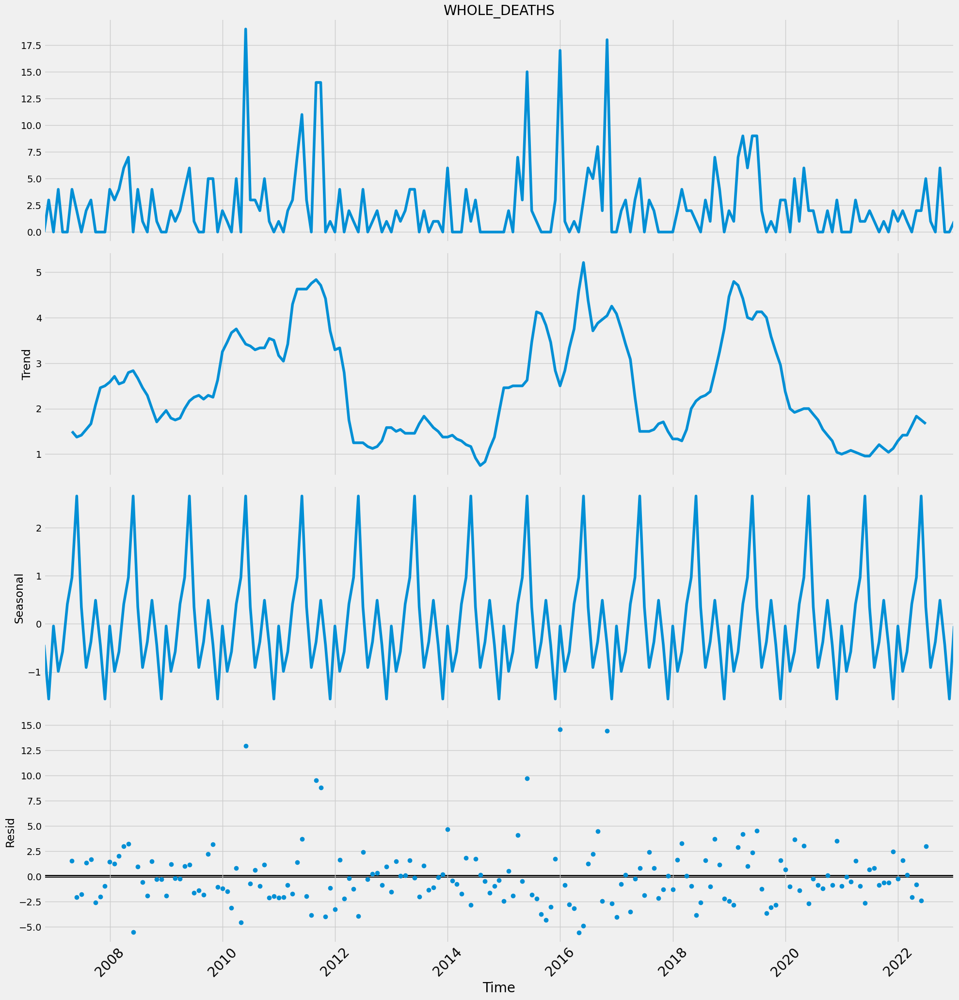

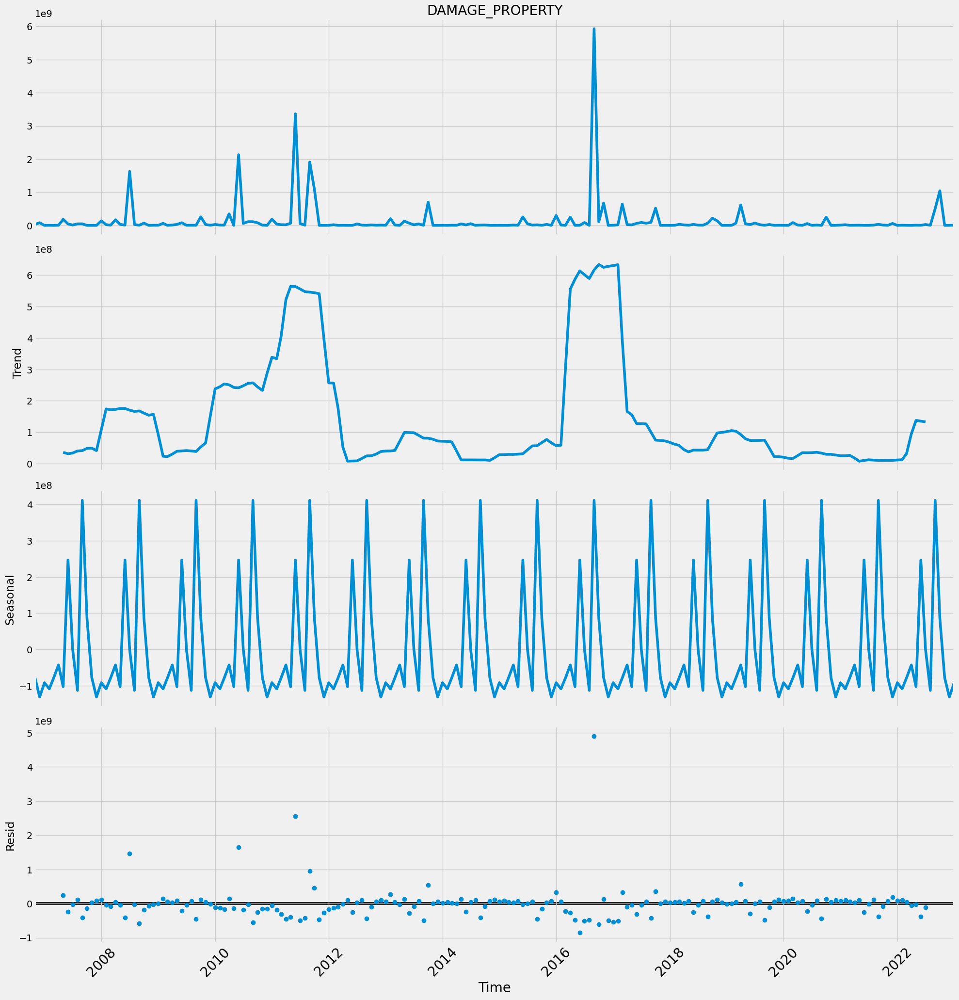

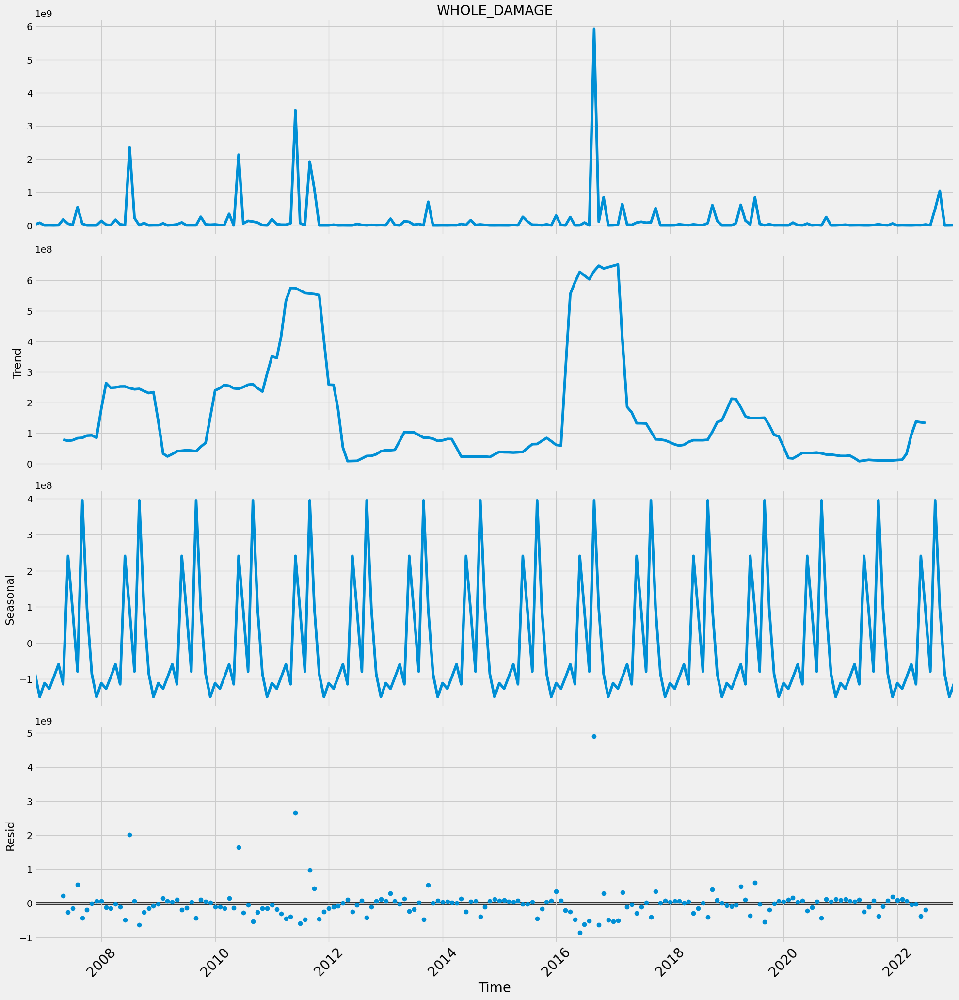

In [43]:
decomposition(df_2, var='INJURIES_DIRECT', model='additive')
decomposition(df_2, var='WHOLE_INJURIES', model='additive')
decomposition(df_2, var='DEATHS_DIRECT', model='additive')
decomposition(df_2, var='WHOLE_DEATHS', model='additive')
decomposition(df_2, var='DAMAGE_PROPERTY', model='additive')
decomposition(df_2, var='WHOLE_DAMAGE', model='additive')

### Stationarity

In [44]:
ADF_test(df_2, var='INJURIES_DIRECT')
ADF_test(df_2, var='WHOLE_INJURIES')
ADF_test(df_2, var='DEATHS_DIRECT')
ADF_test(df_2, var='WHOLE_DEATHS')
ADF_test(df_2, var='DAMAGE_PROPERTY')
ADF_test(df_2, var='WHOLE_DAMAGE')





ADF Statistic: -196.122111
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -45.792641
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -44.021888
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -51.510796
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -25.250976
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -25.285063
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


### CATEGORICAL ANALYSIS

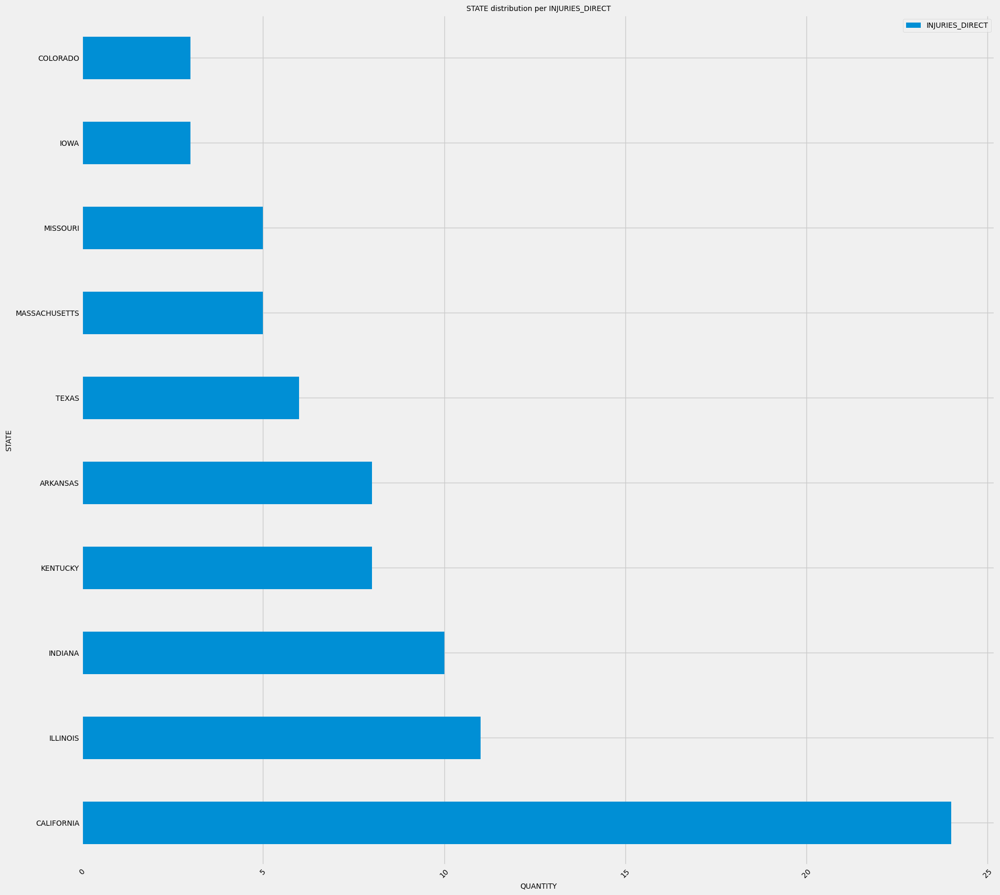

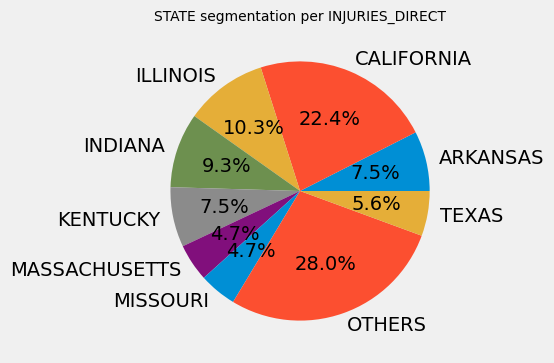

In [45]:
catplot(df_2, var_c='STATE', var_t='INJURIES_DIRECT', threshold=5)

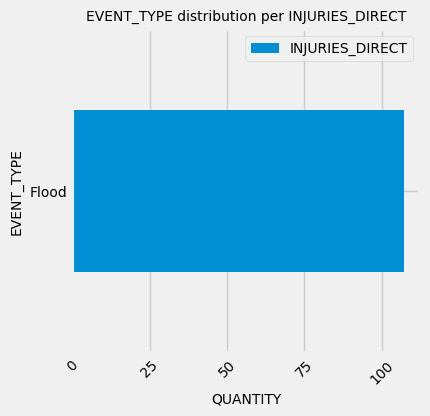

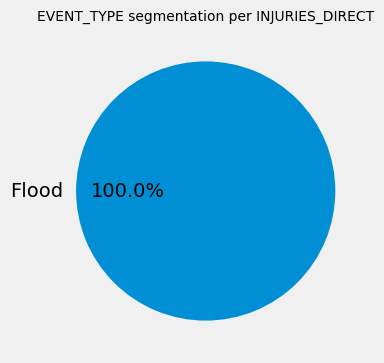

In [46]:
catplot(df_2, var_c='EVENT_TYPE', var_t='INJURIES_DIRECT',threshold=5)

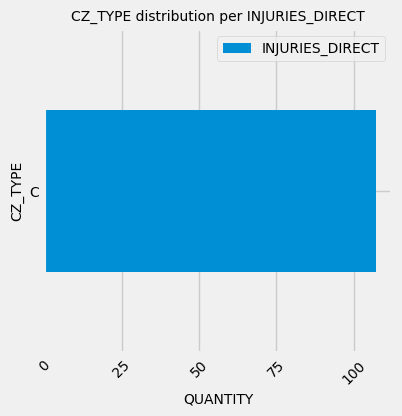

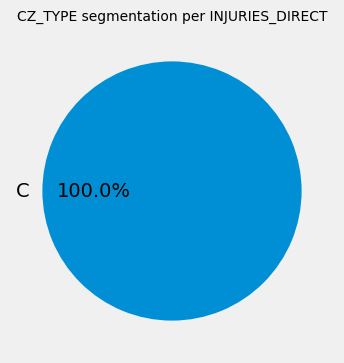

In [47]:
catplot(df_2, var_c='CZ_TYPE', var_t='INJURIES_DIRECT',threshold=5)

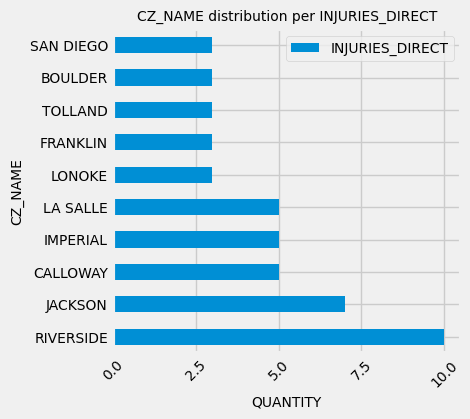

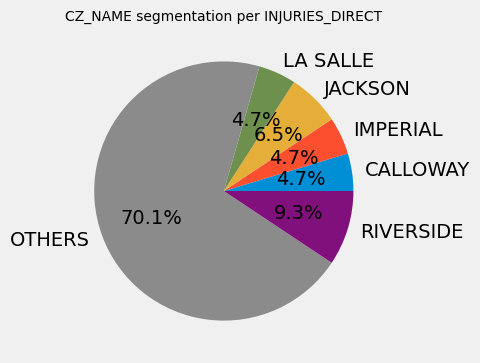

In [48]:
catplot(df_2, var_c='CZ_NAME', var_t='INJURIES_DIRECT',threshold=5)

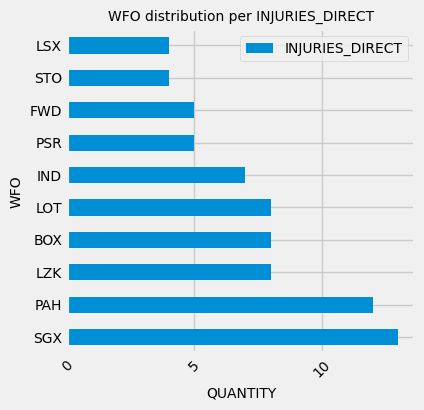

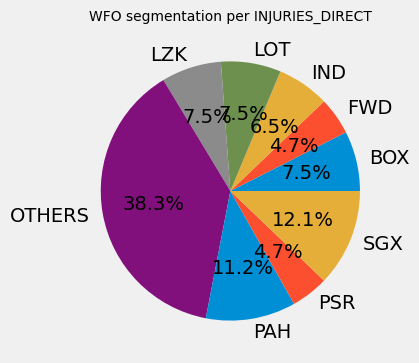

In [49]:
catplot(df_2, var_c='WFO', var_t='INJURIES_DIRECT',threshold=5)


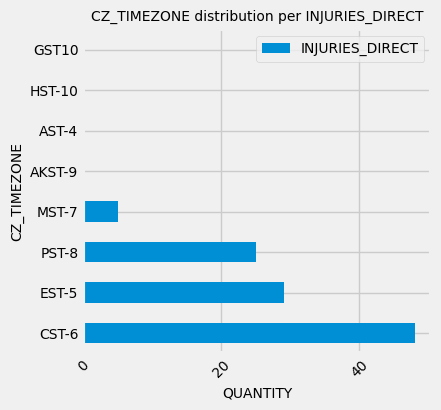

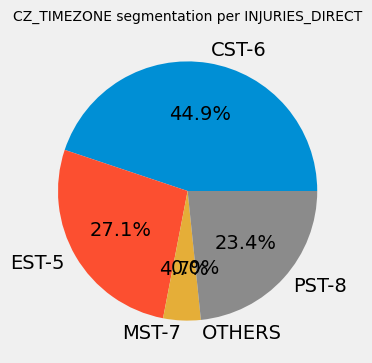

In [50]:
catplot(df_2, var_c='CZ_TIMEZONE', var_t='INJURIES_DIRECT',threshold=5)

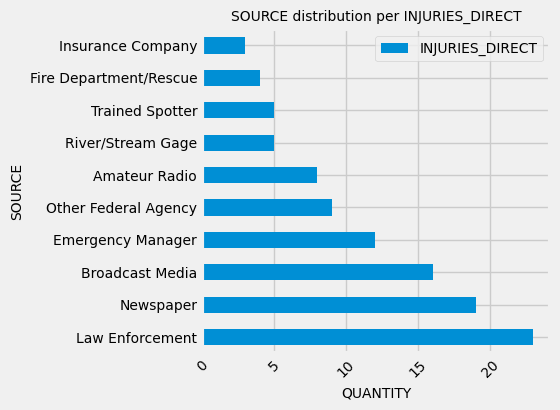

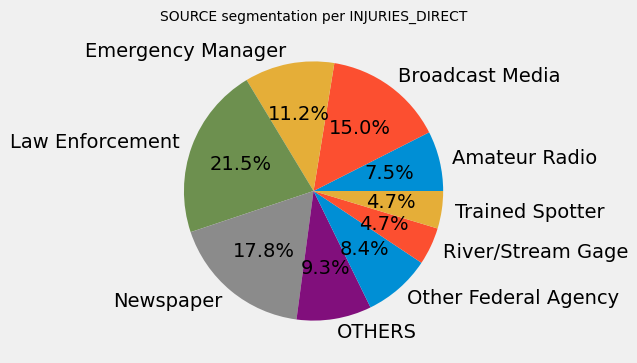

In [51]:
catplot(df_2, var_c='SOURCE', var_t='INJURIES_DIRECT',threshold=5)


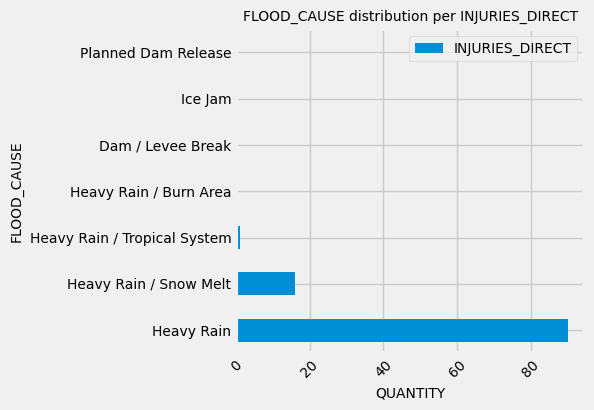

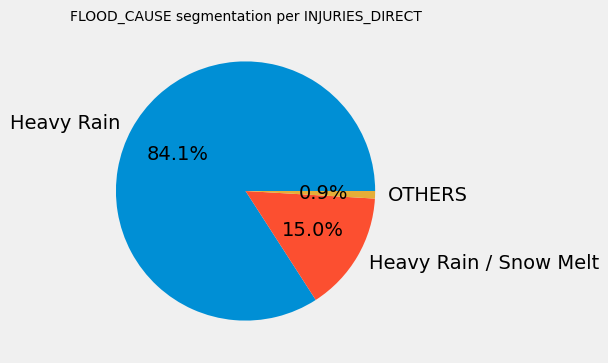

In [52]:
catplot(df_2, var_c='FLOOD_CAUSE', var_t='INJURIES_DIRECT',threshold=5)


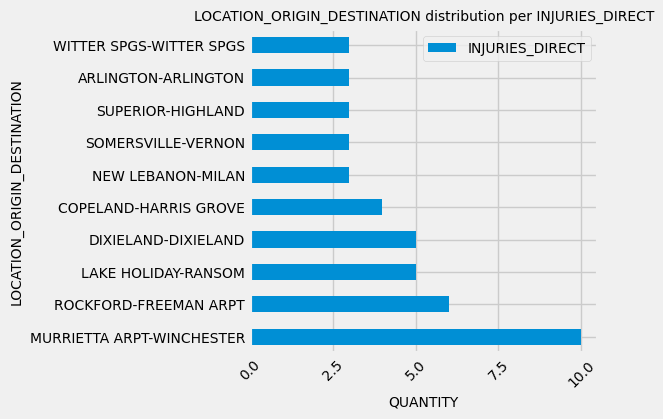

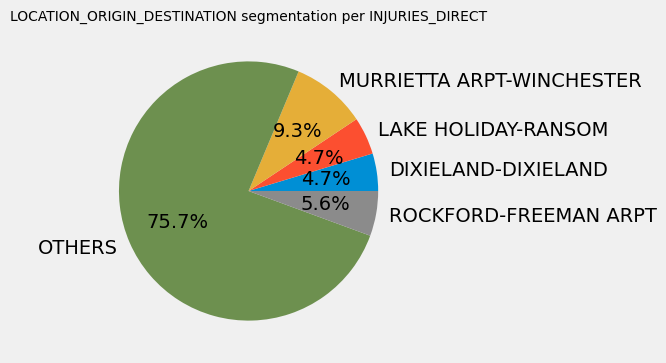

In [53]:
catplot(df_2, var_c='LOCATION_ORIGIN_DESTINATION', var_t='INJURIES_DIRECT',threshold=5)


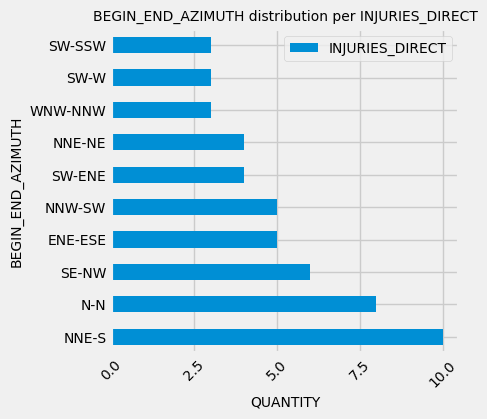

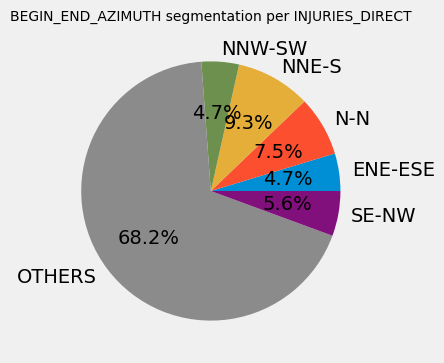

In [54]:
catplot(df_2, var_c='BEGIN_END_AZIMUTH', var_t='INJURIES_DIRECT',threshold=5)


### NUMERICAL ANALYSIS

In [55]:
num_cols = [cname for cname in df_2.columns if
       df_2[cname].dtype in ['float64','int64']]
num = df_2[num_cols]

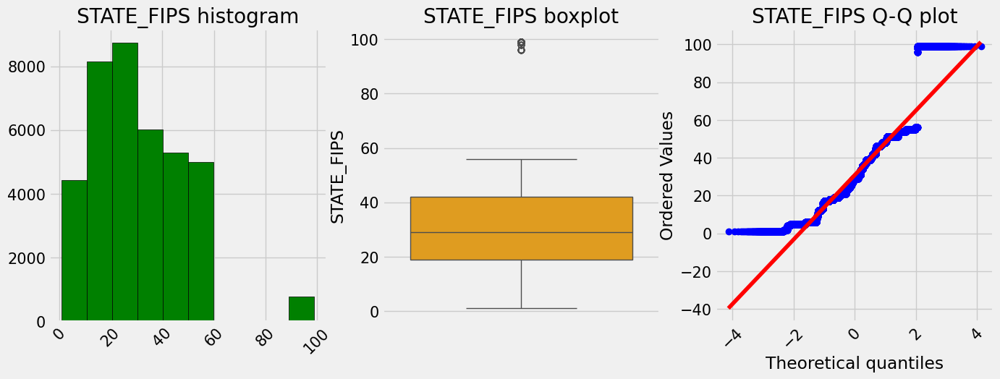

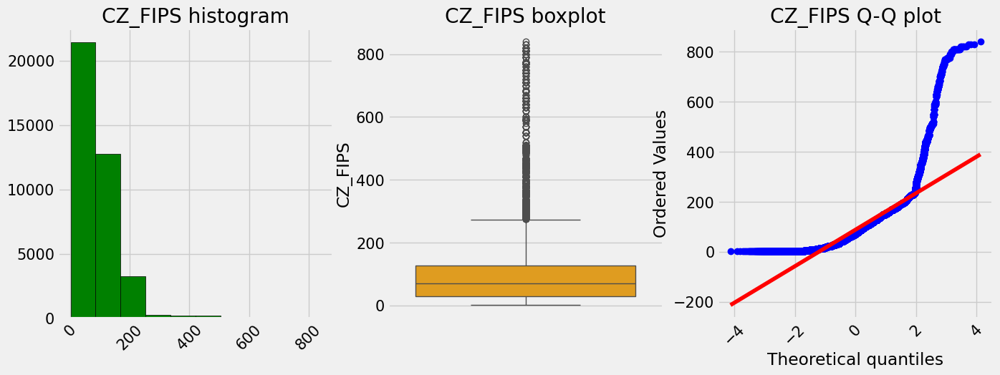

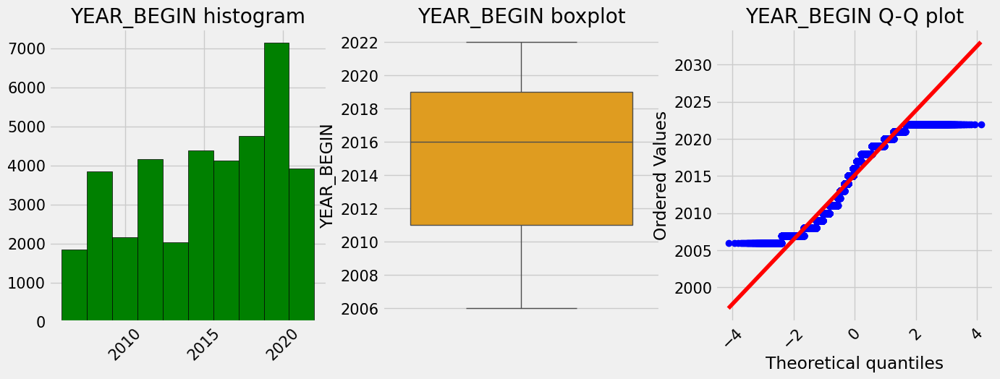

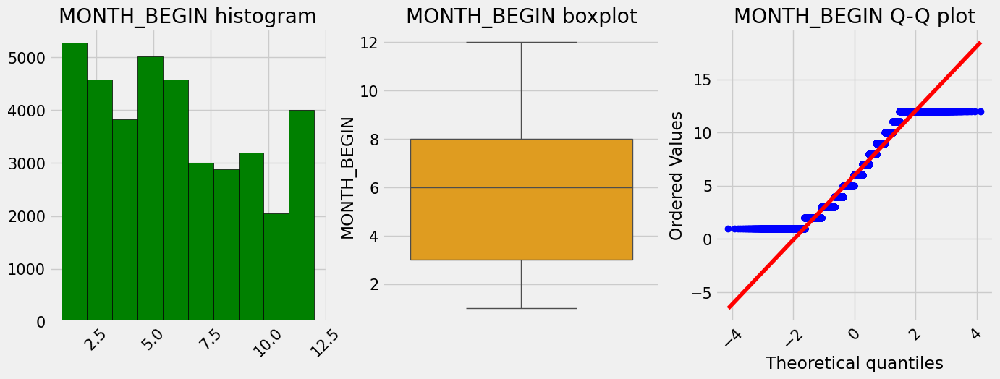

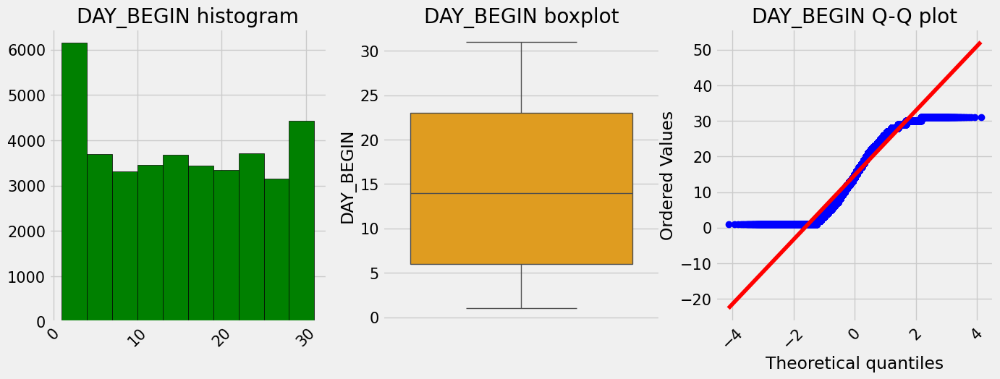

...

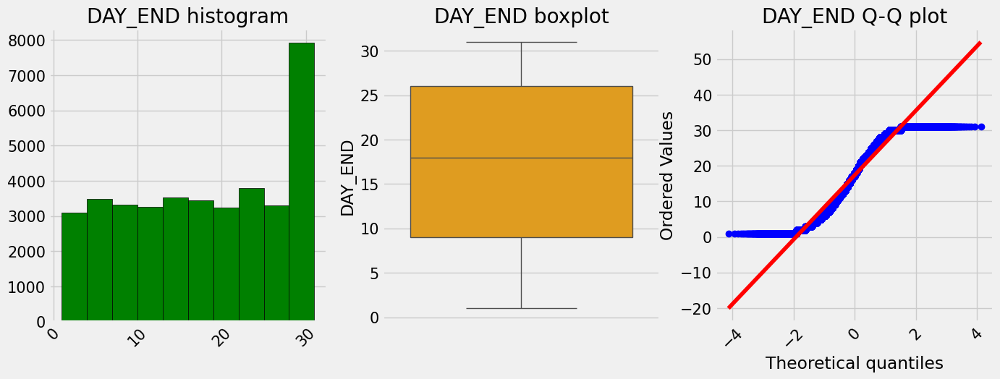

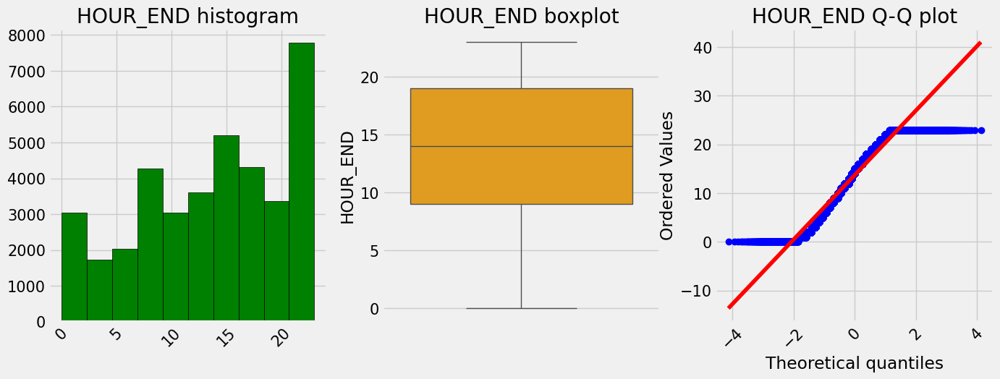

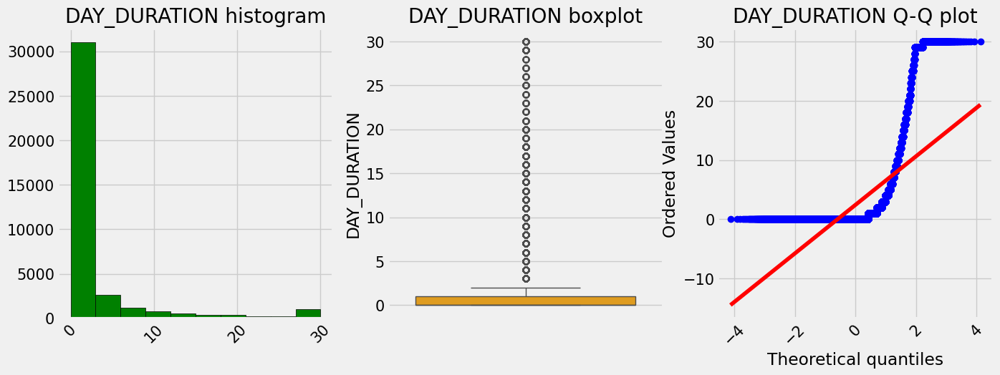

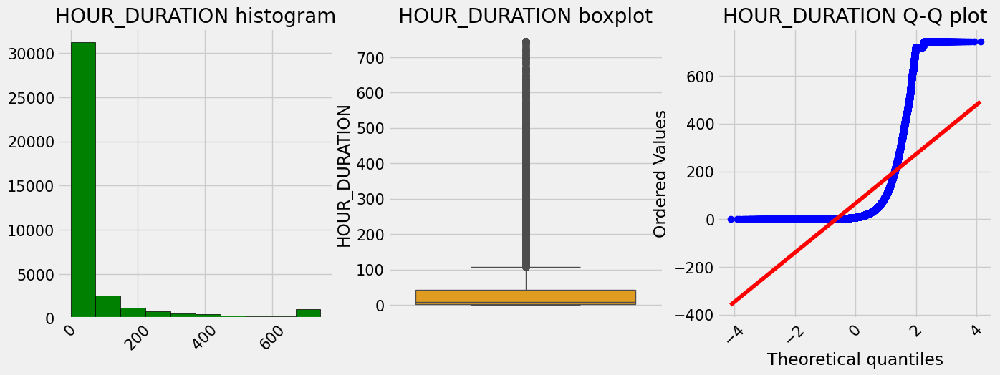

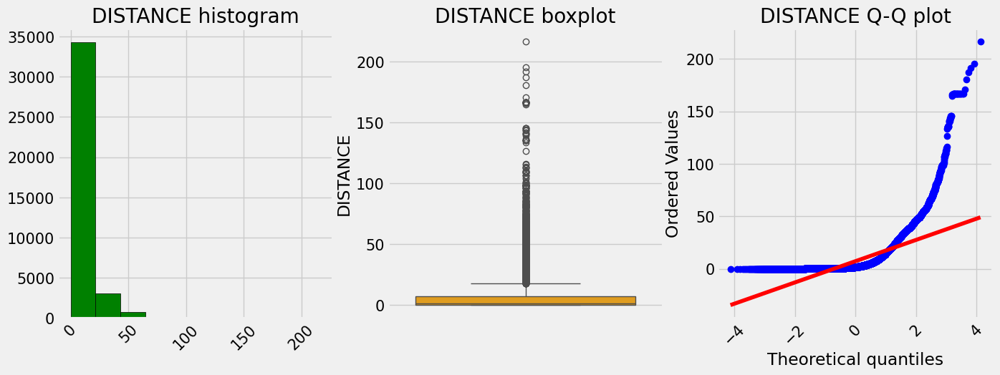

In [56]:
plot_num(num, var='STATE_FIPS')
plot_num(num, var='CZ_FIPS')
plot_num(num, var='YEAR_BEGIN')
plot_num(num, var='MONTH_BEGIN')
plot_num(num, var='DAY_BEGIN')
plot_num(num, var='HOUR_BEGIN')
plot_num(num, var='YEAR_END')
plot_num(num, var='MONTH_END')
plot_num(num, var='DAY_END')
plot_num(num, var='HOUR_END')
plot_num(num, var='DAY_DURATION')
plot_num(num, var='HOUR_DURATION')
plot_num(num, var='DISTANCE')

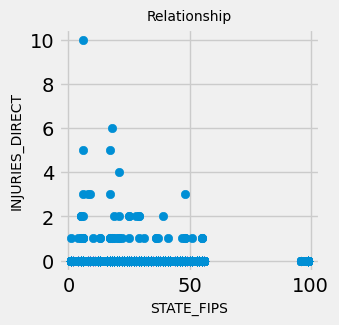

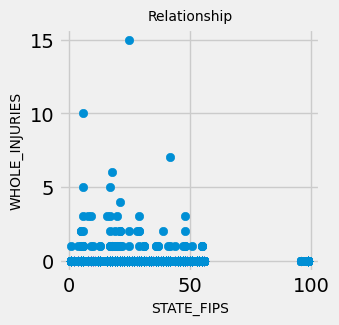

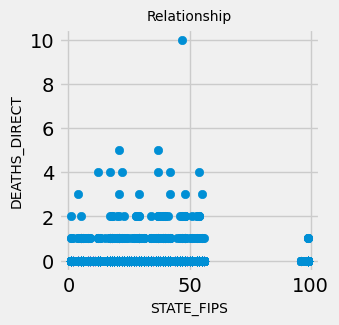

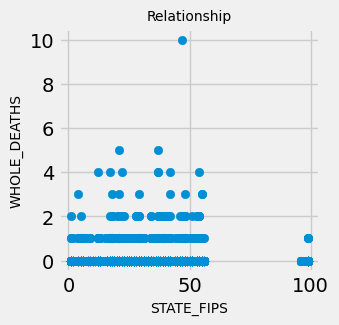

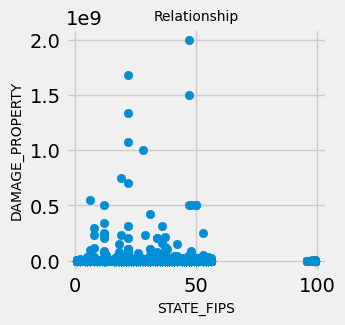

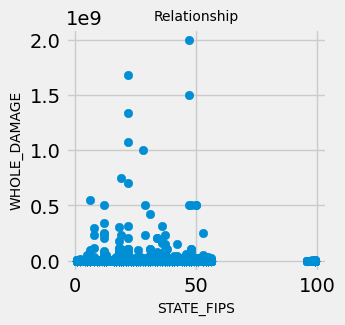

In [57]:
numscatterplot(num, var='STATE_FIPS', target='INJURIES_DIRECT')
numscatterplot(num, var='STATE_FIPS', target='WHOLE_INJURIES')
numscatterplot(num, var='STATE_FIPS', target='DEATHS_DIRECT')
numscatterplot(num, var='STATE_FIPS', target='WHOLE_DEATHS')
numscatterplot(num, var='STATE_FIPS', target='DAMAGE_PROPERTY')
numscatterplot(num, var='STATE_FIPS', target='WHOLE_DAMAGE')

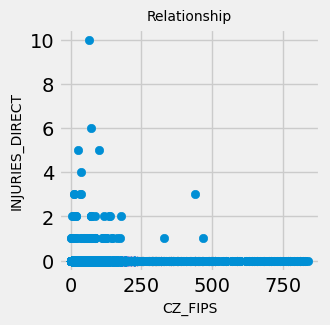

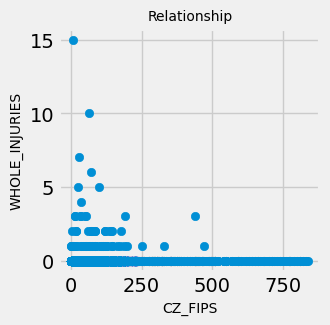

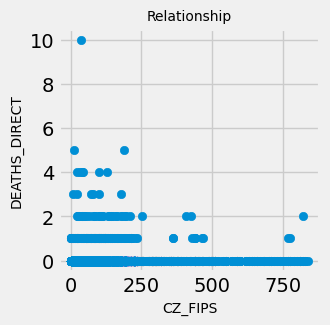

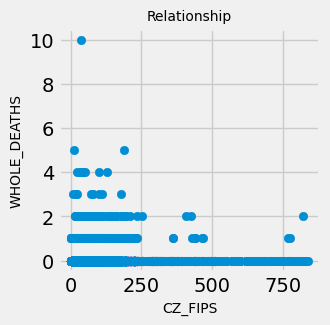

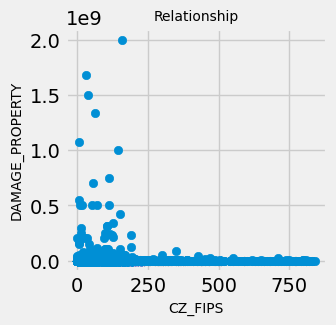

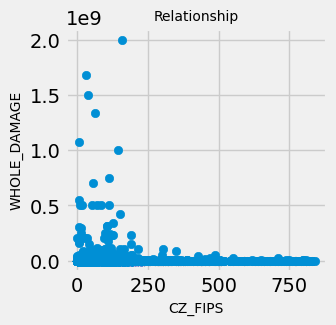

In [58]:
numscatterplot(num, var='CZ_FIPS', target='INJURIES_DIRECT')
numscatterplot(num, var='CZ_FIPS', target='WHOLE_INJURIES')
numscatterplot(num, var='CZ_FIPS', target='DEATHS_DIRECT')
numscatterplot(num, var='CZ_FIPS', target='WHOLE_DEATHS')
numscatterplot(num, var='CZ_FIPS', target='DAMAGE_PROPERTY')
numscatterplot(num, var='CZ_FIPS', target='WHOLE_DAMAGE')

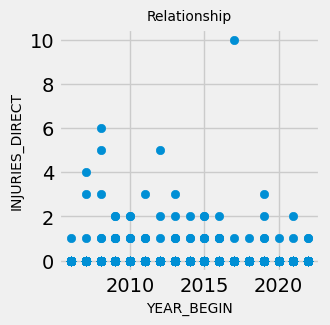

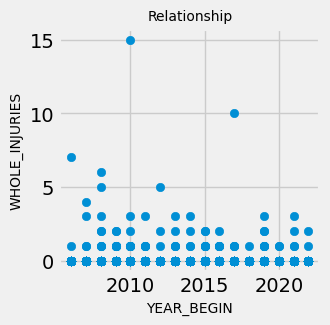

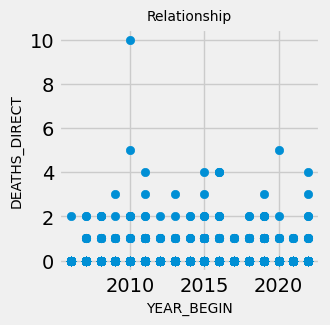

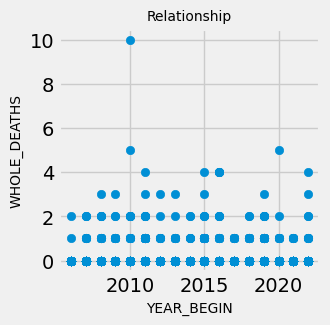

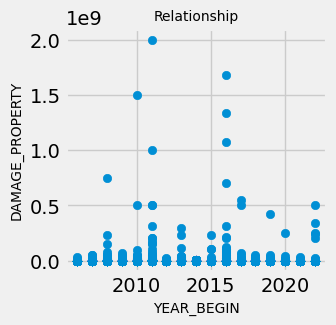

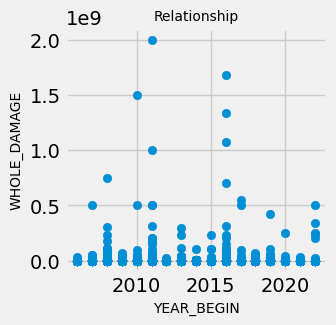

In [59]:
numscatterplot(num, var='YEAR_BEGIN', target='INJURIES_DIRECT')
numscatterplot(num, var='YEAR_BEGIN', target='WHOLE_INJURIES')
numscatterplot(num, var='YEAR_BEGIN', target='DEATHS_DIRECT')
numscatterplot(num, var='YEAR_BEGIN', target='WHOLE_DEATHS')
numscatterplot(num, var='YEAR_BEGIN', target='DAMAGE_PROPERTY')
numscatterplot(num, var='YEAR_BEGIN', target='WHOLE_DAMAGE')

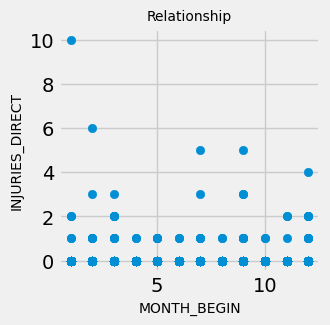

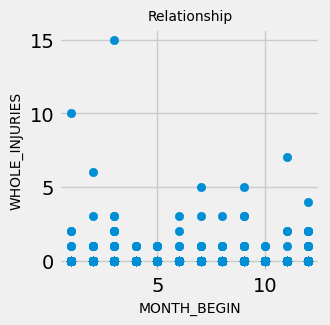

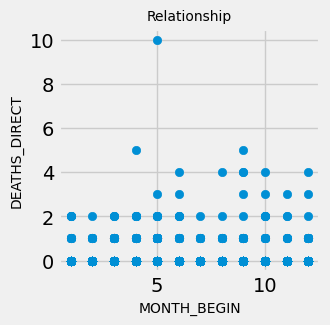

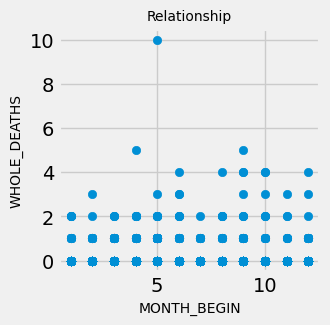

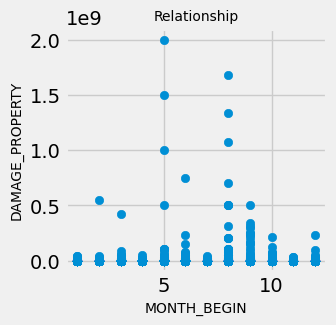

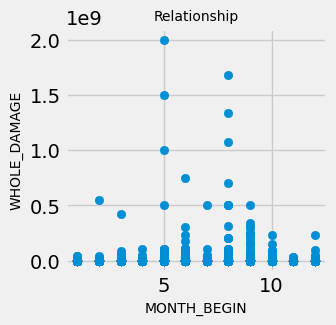

In [60]:
numscatterplot(num, var='MONTH_BEGIN', target='INJURIES_DIRECT')
numscatterplot(num, var='MONTH_BEGIN', target='WHOLE_INJURIES')
numscatterplot(num, var='MONTH_BEGIN', target='DEATHS_DIRECT')
numscatterplot(num, var='MONTH_BEGIN', target='WHOLE_DEATHS')
numscatterplot(num, var='MONTH_BEGIN', target='DAMAGE_PROPERTY')
numscatterplot(num, var='MONTH_BEGIN', target='WHOLE_DAMAGE')

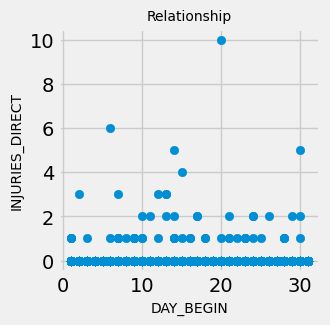

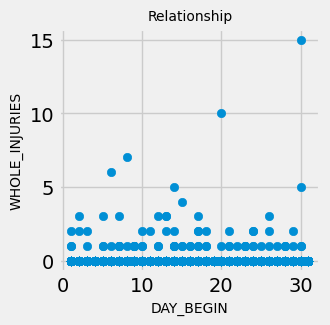

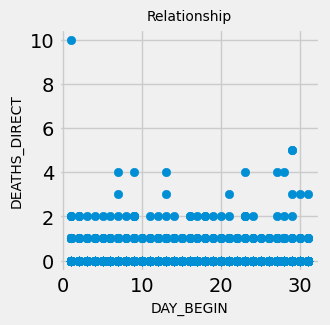

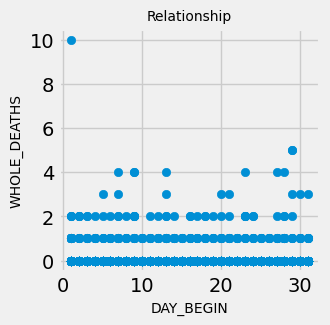

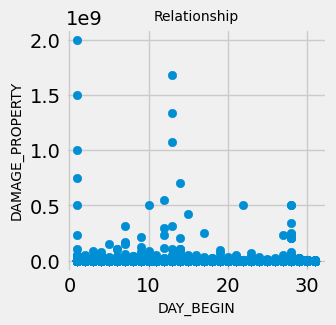

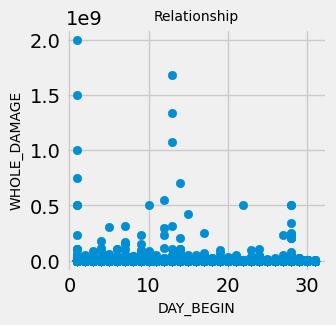

In [61]:
numscatterplot(num, var='DAY_BEGIN', target='INJURIES_DIRECT')
numscatterplot(num, var='DAY_BEGIN', target='WHOLE_INJURIES')
numscatterplot(num, var='DAY_BEGIN', target='DEATHS_DIRECT')
numscatterplot(num, var='DAY_BEGIN', target='WHOLE_DEATHS')
numscatterplot(num, var='DAY_BEGIN', target='DAMAGE_PROPERTY')
numscatterplot(num, var='DAY_BEGIN', target='WHOLE_DAMAGE')

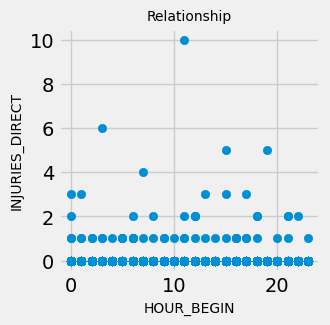

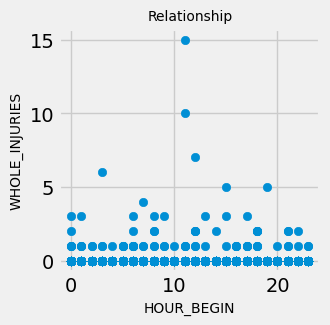

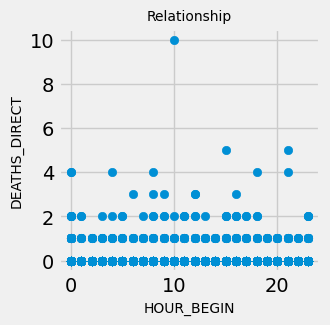

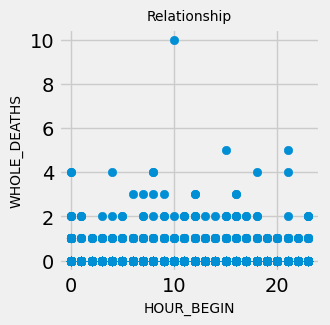

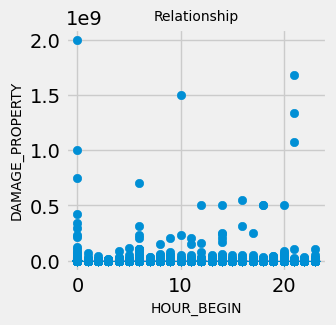

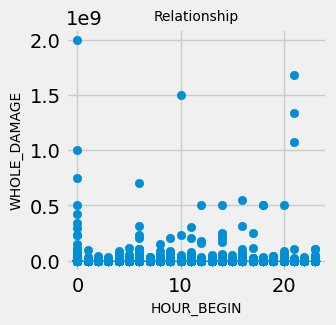

In [62]:
numscatterplot(num, var='HOUR_BEGIN', target='INJURIES_DIRECT')
numscatterplot(num, var='HOUR_BEGIN', target='WHOLE_INJURIES')
numscatterplot(num, var='HOUR_BEGIN', target='DEATHS_DIRECT')
numscatterplot(num, var='HOUR_BEGIN', target='WHOLE_DEATHS')
numscatterplot(num, var='HOUR_BEGIN', target='DAMAGE_PROPERTY')
numscatterplot(num, var='HOUR_BEGIN', target='WHOLE_DAMAGE')

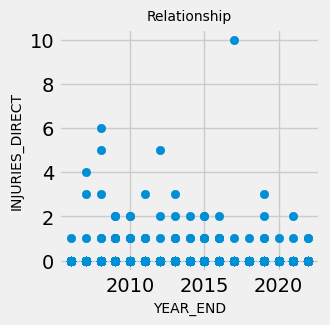

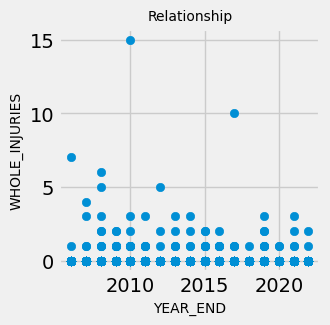

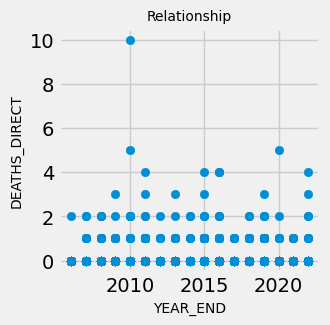

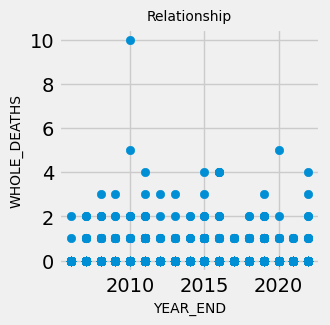

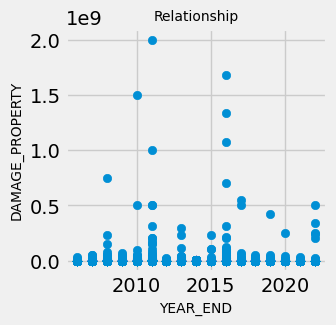

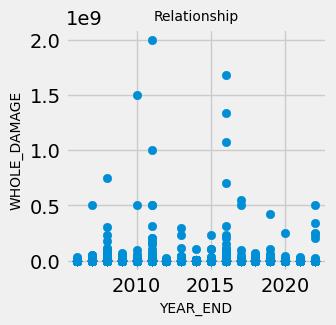

In [63]:
numscatterplot(num, var='YEAR_END', target='INJURIES_DIRECT')
numscatterplot(num, var='YEAR_END', target='WHOLE_INJURIES')
numscatterplot(num, var='YEAR_END', target='DEATHS_DIRECT')
numscatterplot(num, var='YEAR_END', target='WHOLE_DEATHS')
numscatterplot(num, var='YEAR_END', target='DAMAGE_PROPERTY')
numscatterplot(num, var='YEAR_END', target='WHOLE_DAMAGE')

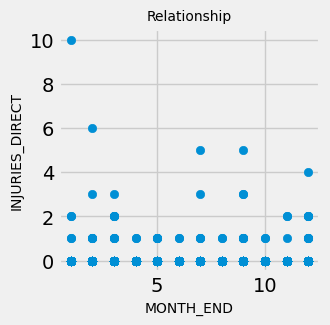

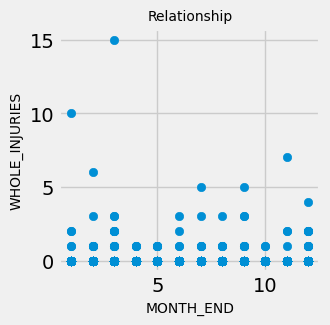

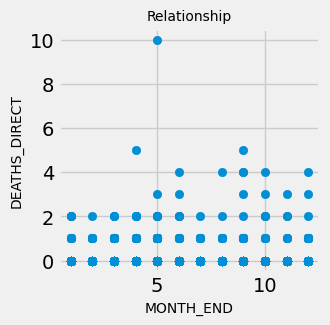

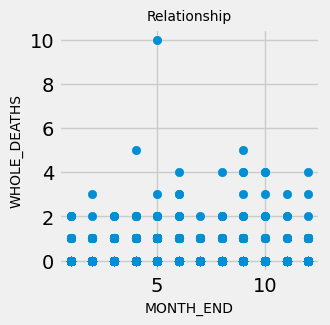

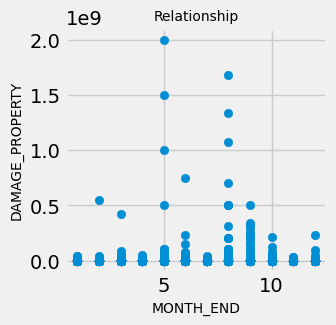

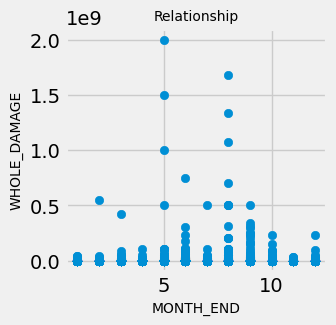

In [64]:
numscatterplot(num, var='MONTH_END', target='INJURIES_DIRECT')
numscatterplot(num, var='MONTH_END', target='WHOLE_INJURIES')
numscatterplot(num, var='MONTH_END', target='DEATHS_DIRECT')
numscatterplot(num, var='MONTH_END', target='WHOLE_DEATHS')
numscatterplot(num, var='MONTH_END', target='DAMAGE_PROPERTY')
numscatterplot(num, var='MONTH_END', target='WHOLE_DAMAGE')

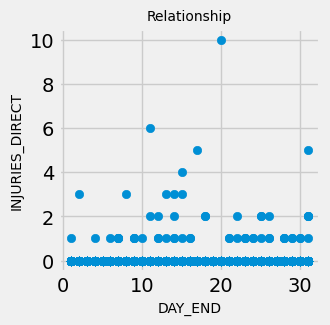

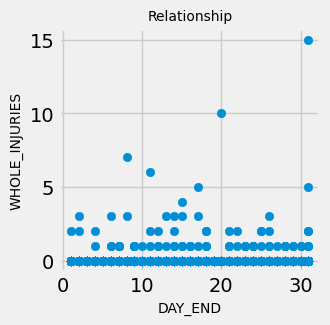

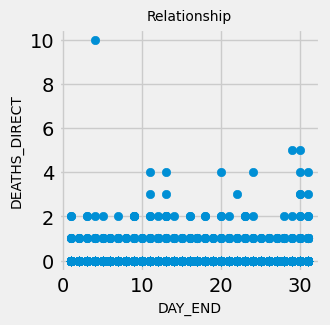

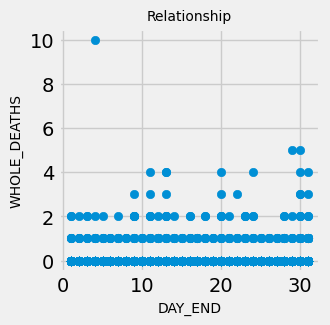

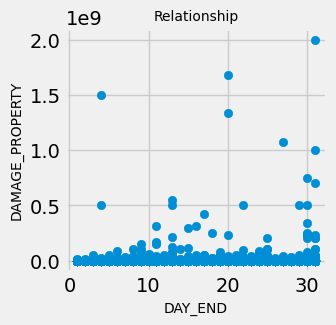

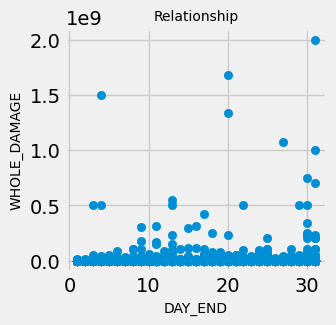

In [65]:
numscatterplot(num, var='DAY_END', target='INJURIES_DIRECT')
numscatterplot(num, var='DAY_END', target='WHOLE_INJURIES')
numscatterplot(num, var='DAY_END', target='DEATHS_DIRECT')
numscatterplot(num, var='DAY_END', target='WHOLE_DEATHS')
numscatterplot(num, var='DAY_END', target='DAMAGE_PROPERTY')
numscatterplot(num, var='DAY_END', target='WHOLE_DAMAGE')

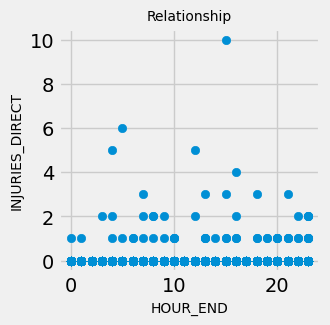

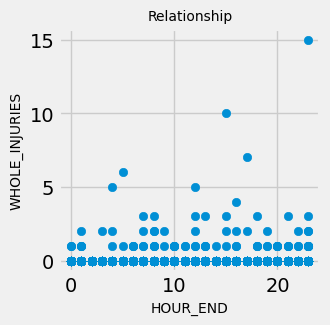

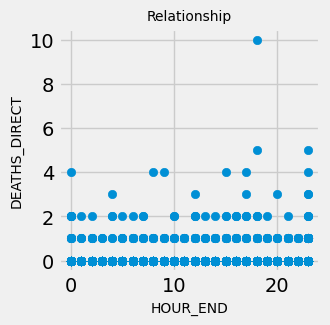

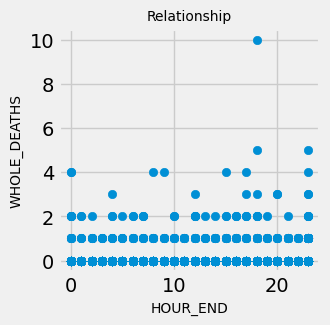

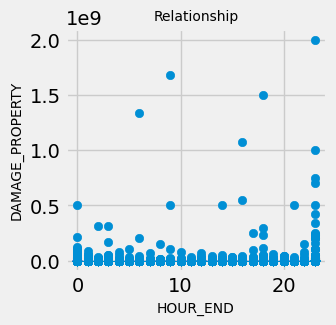

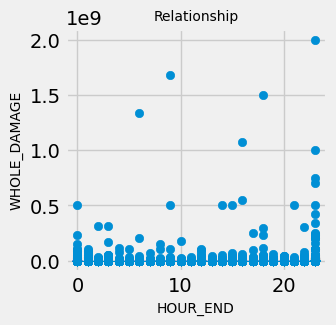

In [66]:
numscatterplot(num, var='HOUR_END', target='INJURIES_DIRECT')
numscatterplot(num, var='HOUR_END', target='WHOLE_INJURIES')
numscatterplot(num, var='HOUR_END', target='DEATHS_DIRECT')
numscatterplot(num, var='HOUR_END', target='WHOLE_DEATHS')
numscatterplot(num, var='HOUR_END', target='DAMAGE_PROPERTY')
numscatterplot(num, var='HOUR_END', target='WHOLE_DAMAGE')

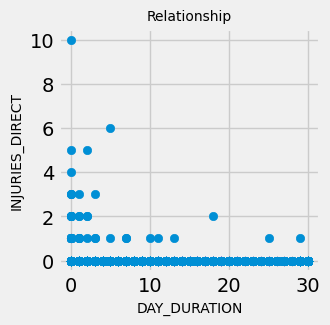

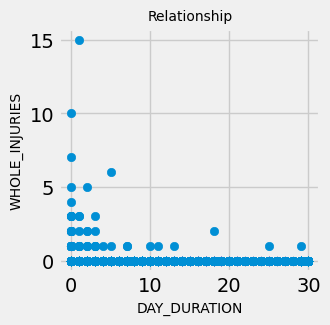

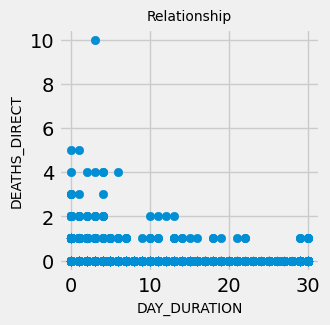

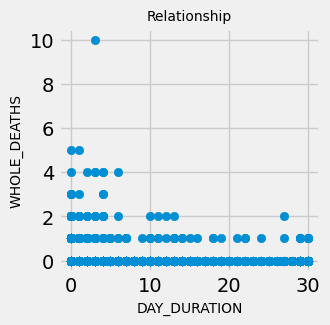

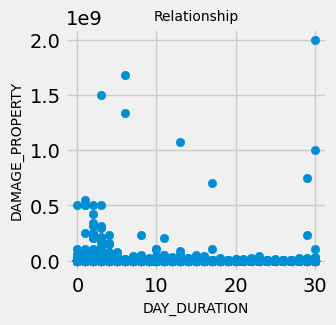

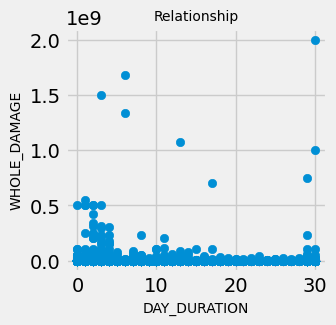

In [67]:
numscatterplot(num, var='DAY_DURATION', target='INJURIES_DIRECT')
numscatterplot(num, var='DAY_DURATION', target='WHOLE_INJURIES')
numscatterplot(num, var='DAY_DURATION', target='DEATHS_DIRECT')
numscatterplot(num, var='DAY_DURATION', target='WHOLE_DEATHS')
numscatterplot(num, var='DAY_DURATION', target='DAMAGE_PROPERTY')
numscatterplot(num, var='DAY_DURATION', target='WHOLE_DAMAGE')

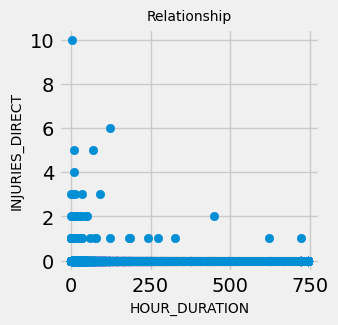

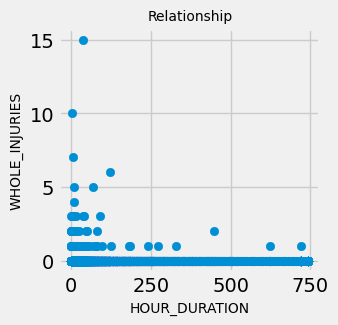

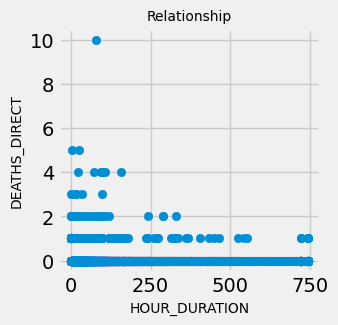

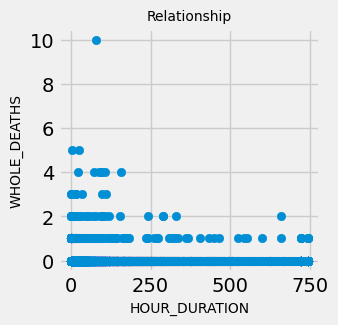

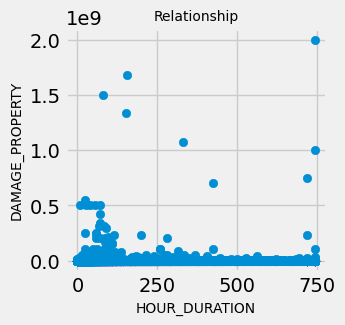

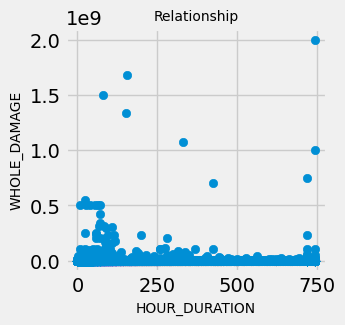

In [68]:
numscatterplot(num, var='HOUR_DURATION', target='INJURIES_DIRECT')
numscatterplot(num, var='HOUR_DURATION', target='WHOLE_INJURIES')
numscatterplot(num, var='HOUR_DURATION', target='DEATHS_DIRECT')
numscatterplot(num, var='HOUR_DURATION', target='WHOLE_DEATHS')
numscatterplot(num, var='HOUR_DURATION', target='DAMAGE_PROPERTY')
numscatterplot(num, var='HOUR_DURATION', target='WHOLE_DAMAGE')

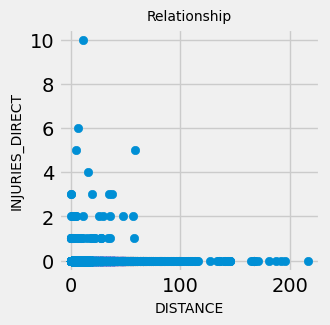

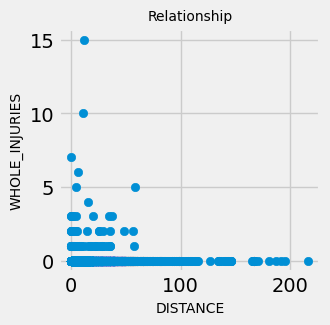

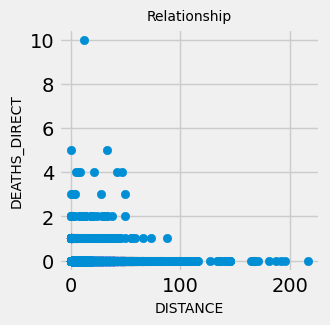

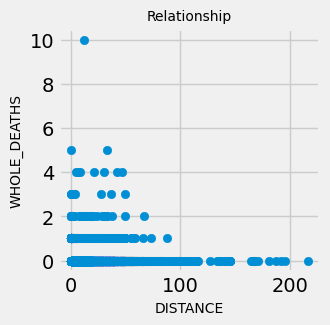

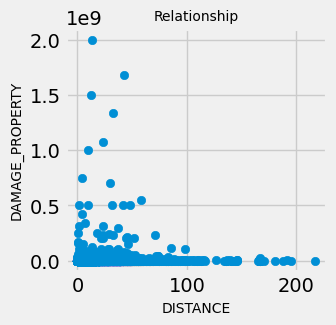

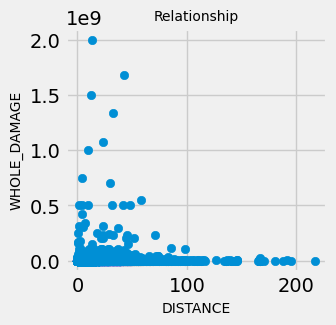

In [69]:
numscatterplot(num, var='DISTANCE', target='INJURIES_DIRECT')
numscatterplot(num, var='DISTANCE', target='WHOLE_INJURIES')
numscatterplot(num, var='DISTANCE', target='DEATHS_DIRECT')
numscatterplot(num, var='DISTANCE', target='WHOLE_DEATHS')
numscatterplot(num, var='DISTANCE', target='DAMAGE_PROPERTY')
numscatterplot(num, var='DISTANCE', target='WHOLE_DAMAGE')

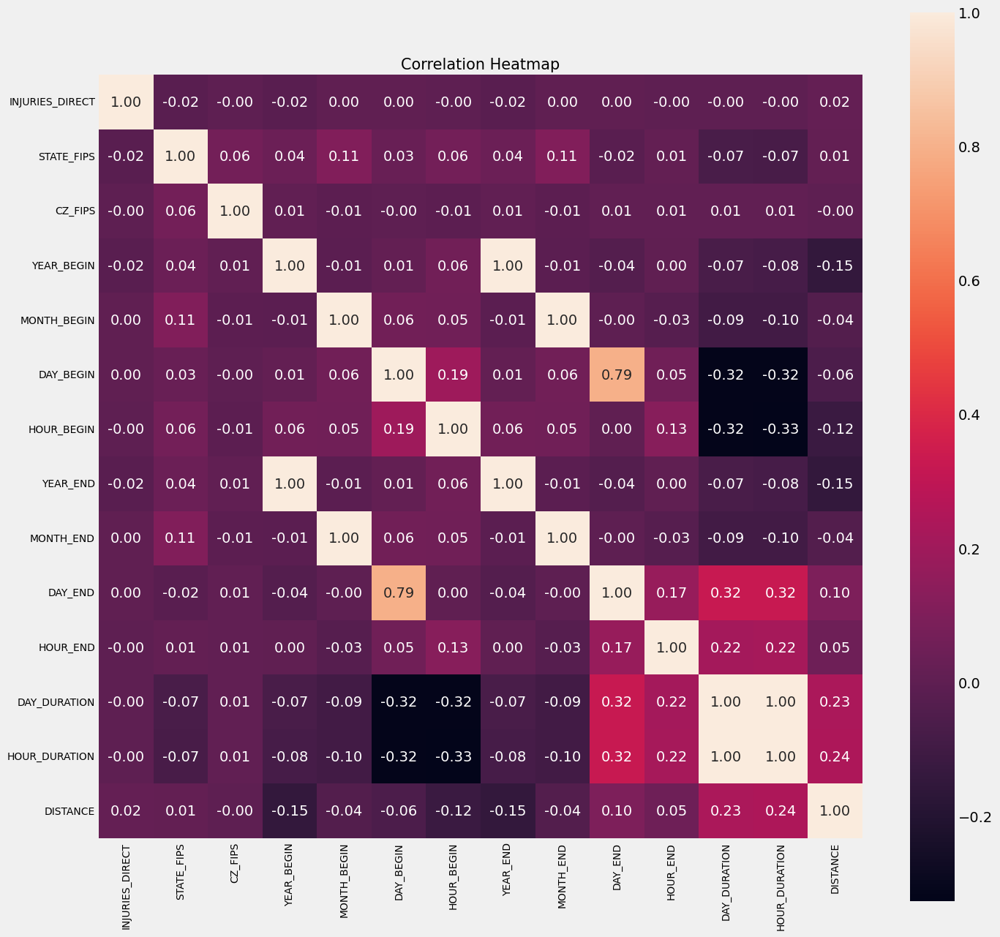

In [70]:
# Correlation heatmap
corr_matrix_id = num[['INJURIES_DIRECT','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN',
                      'DAY_BEGIN','HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END',
                      'DAY_DURATION','HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_id)

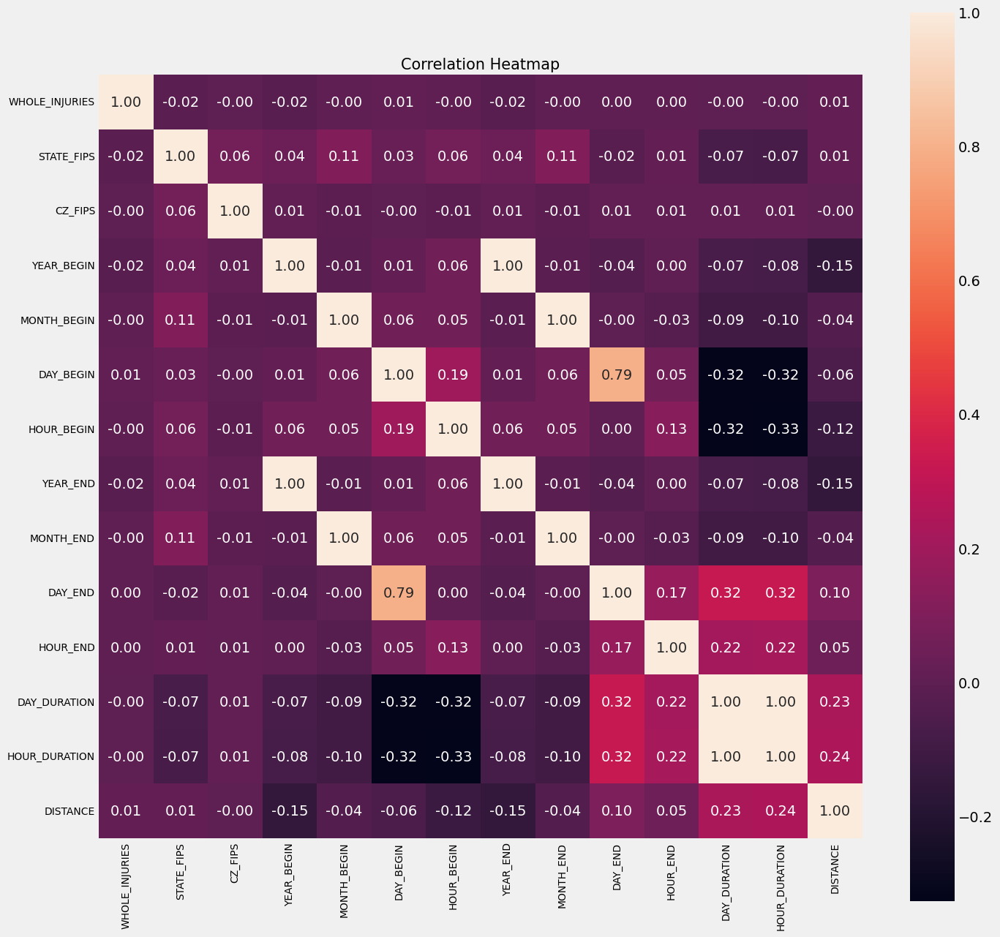

In [71]:
# Correlation heatmap
corr_matrix_wi = num[['WHOLE_INJURIES','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_wi)

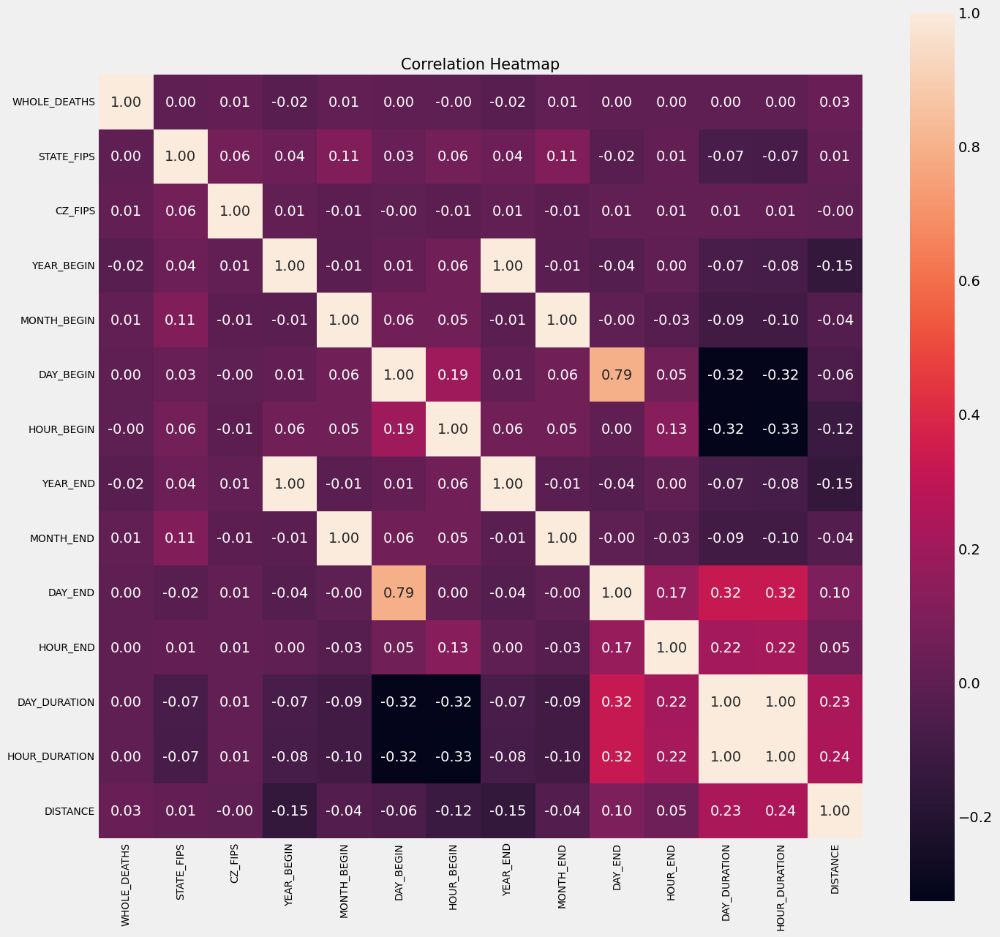

In [72]:
# Correlation heatmap
corr_matrix_wd = num[['WHOLE_DEATHS','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_wd)

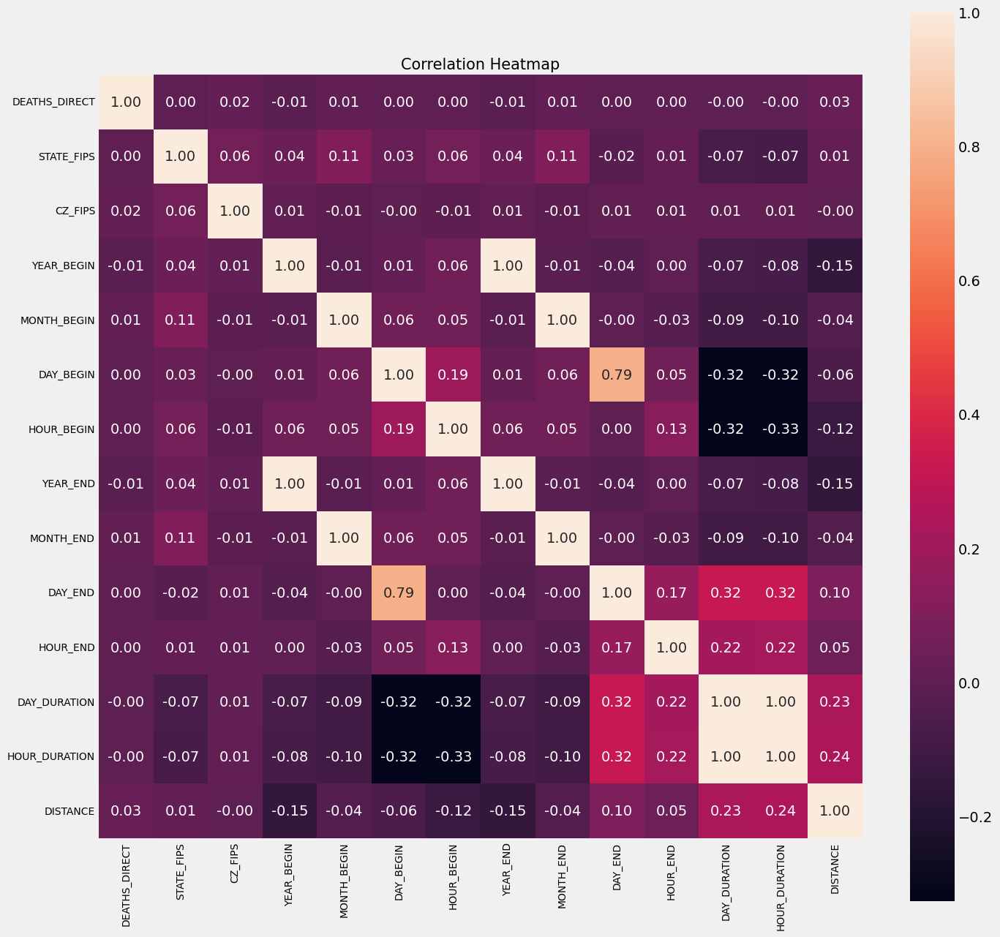

In [73]:
# Correlation heatmap
corr_matrix_dd = num[['DEATHS_DIRECT','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_dd)

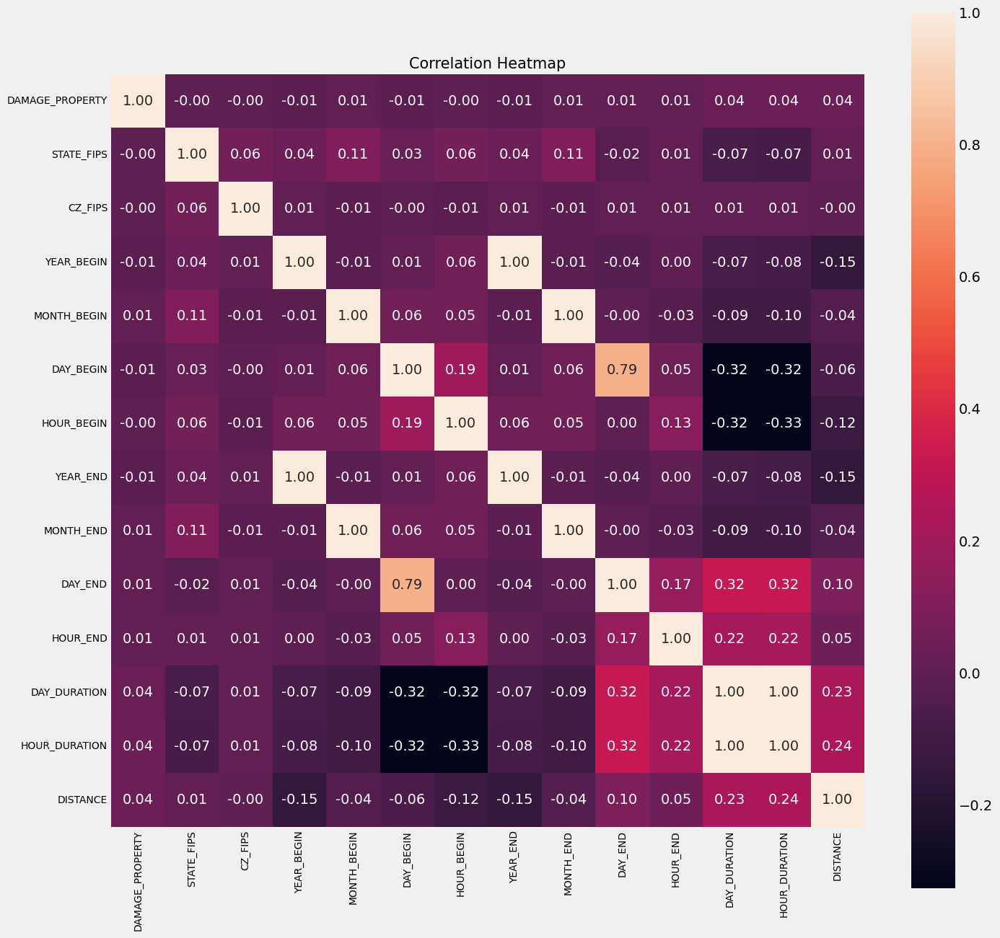

In [74]:
# Correlation heatmap
corr_matrix_dp = num[['DAMAGE_PROPERTY','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_dp)

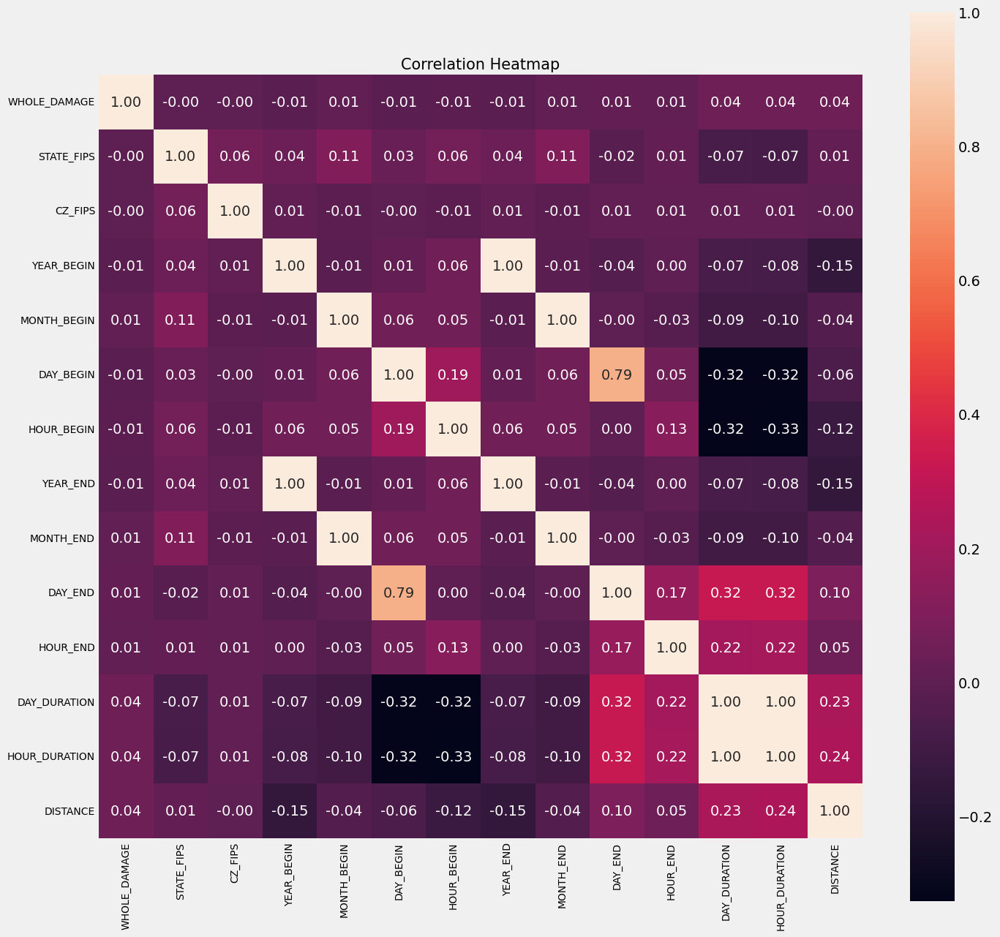

In [75]:
# Correlation heatmap
corr_matrix_wd = num[['WHOLE_DAMAGE','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_wd)

### Text Data Analysis

In [76]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(1,1),                      # n_gram_type
                          token_pattern= r'([a-zA-Z0-9-/]{5,})',  # num chars >= 5
                          min_df=2).fit(corpus)                   # minimum required occurences of a word
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words_episode = get_top_n_words(df_2['EPISODE_NARRATIVE'], 10)
df_uni_episode = pd.DataFrame(common_words_episode, columns = ['unigram' , 'count'])

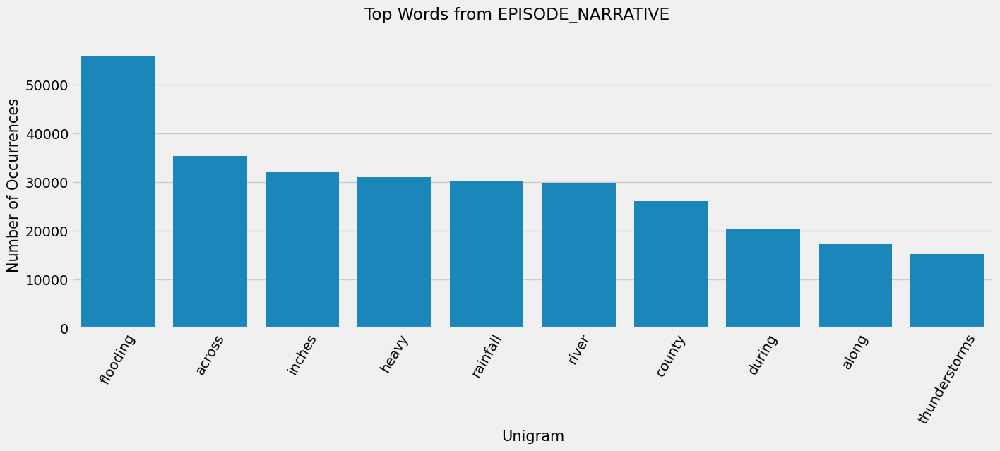

In [77]:
plt.rcParams['figure.figsize']=(15,5)
sns.barplot(x=df_uni_episode['unigram'], y=df_uni_episode['count'])
plt.suptitle('Top Words from EPISODE_NARRATIVE')
plt.ylabel('Number of Occurrences', fontsize=15)
plt.xlabel('Unigram', fontsize=15)
plt.xticks(rotation=60)
plt.show()

In [78]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2,2),                      # n_gram_type
                          token_pattern= r'([a-zA-Z0-9-/]{5,})',  # num chars >= 5
                          min_df=2).fit(corpus)                   # minimum required occurences of a word
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words_episode = get_top_n_words(df_2['EPISODE_NARRATIVE'], 10)
df_bi_episode = pd.DataFrame(common_words_episode, columns = ['bigram' , 'count'])

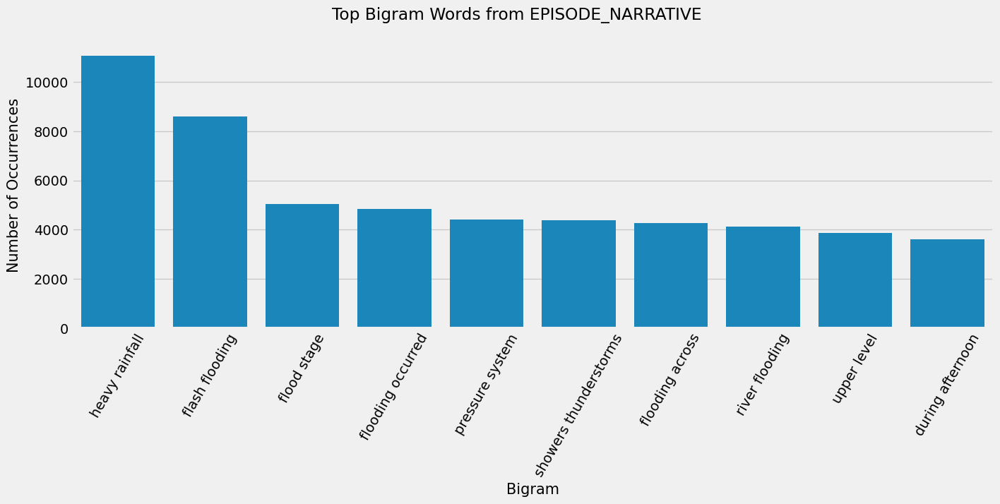

In [79]:
plt.rcParams['figure.figsize']=(15,5)
sns.barplot(x=df_bi_episode['bigram'], y=df_bi_episode['count'])
plt.suptitle('Top Bigram Words from EPISODE_NARRATIVE')
plt.ylabel('Number of Occurrences', fontsize=15)
plt.xlabel('Bigram', fontsize=15)
plt.xticks(rotation=60)
plt.show()

In [80]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(1,1),                      # n_gram_type
                          token_pattern= r'([a-zA-Z0-9-/]{5,})',  # num chars >= 5
                          min_df=2).fit(corpus)                   # minimum required occurences of a word
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words_event = get_top_n_words(df_2['EVENT_NARRATIVE'], 10)
df_uni_event = pd.DataFrame(common_words_event, columns = ['unigram' , 'count'])

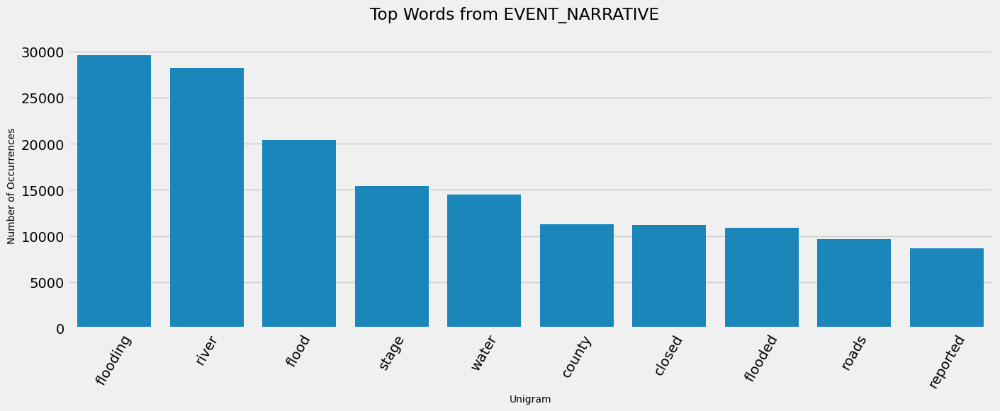

In [81]:
plt.rcParams['figure.figsize']=(15,5)
sns.barplot(x=df_uni_event['unigram'], y=df_uni_event['count'])
plt.suptitle('Top Words from EVENT_NARRATIVE')
plt.ylabel('Number of Occurrences', fontsize=10)
plt.xlabel('Unigram', fontsize=10)
plt.xticks(rotation=60)
plt.show()

In [82]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2,2),                      # n_gram_type
                          token_pattern= r'([a-zA-Z0-9-/]{5,})',  # num chars >= 5
                          min_df=2).fit(corpus)                   # minimum required occurences of a word
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words_event = get_top_n_words(df_2['EVENT_NARRATIVE'], 10)
df_bi_event = pd.DataFrame(common_words_event, columns = ['bigram' , 'count'])

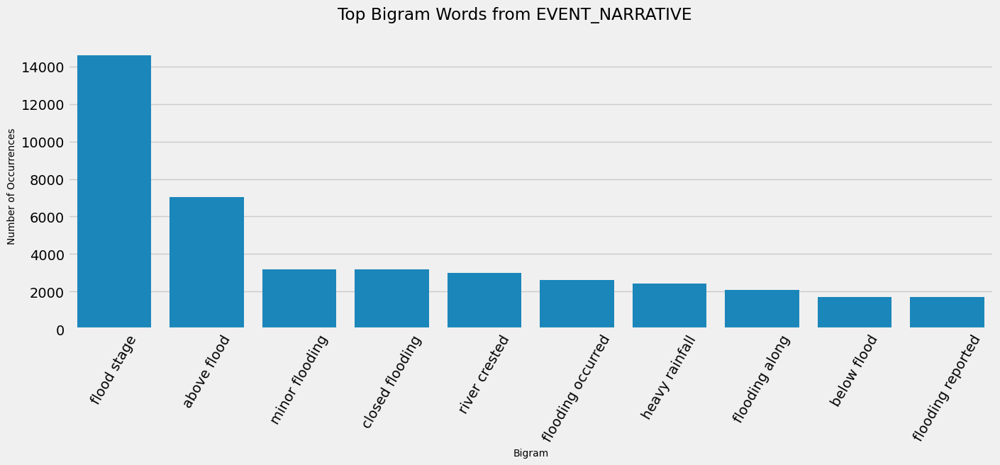

In [83]:
plt.rcParams['figure.figsize']=(15,5)
sns.barplot(x=df_bi_event['bigram'], y=df_bi_event['count'])
plt.suptitle('Top Bigram Words from EVENT_NARRATIVE')
plt.ylabel('Number of Occurrences', fontsize=10)
plt.xlabel('Bigram', fontsize=10)
plt.xticks(rotation=60)
plt.show()

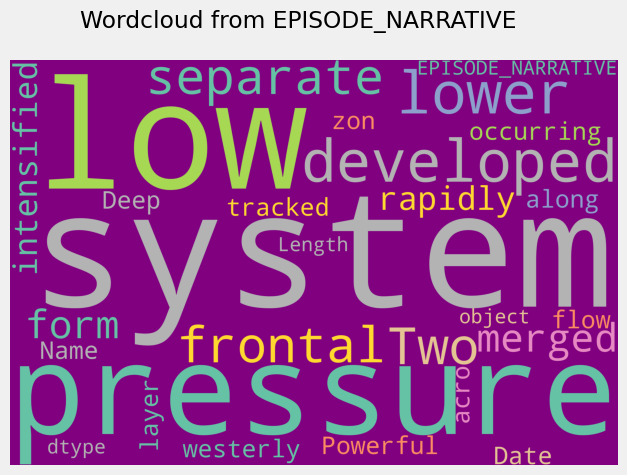

In [84]:
# Generate word cloud
# Create stopword
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(width = 3000, height = 2000, random_state=0, background_color='purple', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(str(df_2['EPISODE_NARRATIVE']))
# Display the generated image
plt.rcParams["figure.figsize"] = (10,5)
plt.suptitle('Wordcloud from EPISODE_NARRATIVE')
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


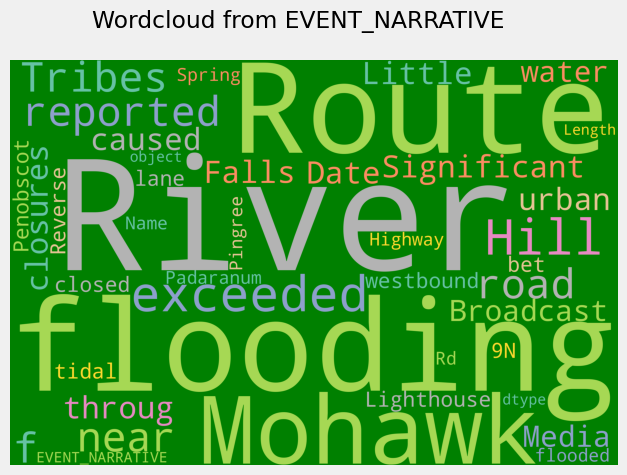

In [87]:
# Generate word cloud
# Create stopword
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(width = 3000, height = 2000, random_state=0, background_color='green', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(str(df_2['EVENT_NARRATIVE']))
# Display the generated image
plt.rcParams["figure.figsize"] = (10,5)
plt.suptitle('Wordcloud from EVENT_NARRATIVE')
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

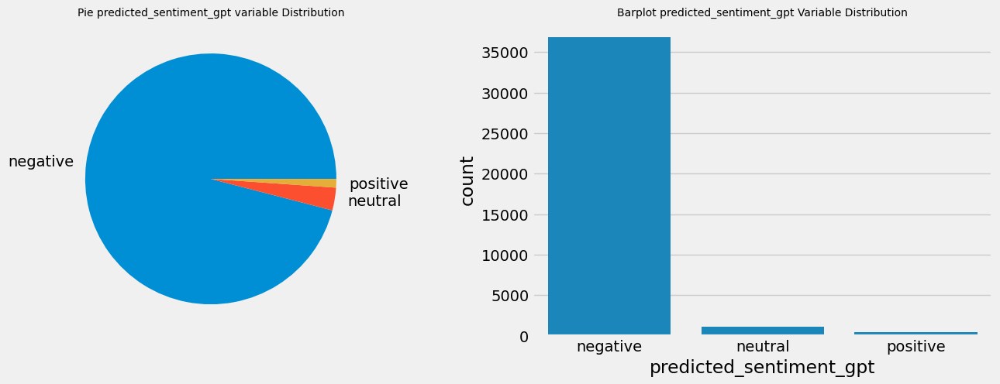

In [105]:
# Plot the target variable
fig, axes = plt.subplots(ncols=2, figsize=(15, 5))
pieplot = df.groupby('predicted_sentiment_gpt').count()['EVENT_ID'].plot(kind='pie',ax=axes[0]).set_title("Pie predicted_sentiment_gpt variable Distribution", fontsize=10)
barplot = sns.countplot(x=df['predicted_sentiment_gpt'], data=df, ax=axes[1]).set_title("Barplot predicted_sentiment_gpt Variable Distribution",fontsize=10)

axes[0].set_ylabel('')

plt.show()